In [1]:
import os
# NOTE: material: https://drive.google.com/drive/u/0/folders/14J6oWZzULqtXfIv99064Cs0iHVdeat22

In [2]:
# NOTE: access to directory
dir_project = os.path.abspath(".")
print(f"{dir_project=}")
os.chdir(dir_project)
print(f"{os.getcwd()}")

dir_project='/root/Documents/Projects/augmented_safeguard/NeRF'
/root/Documents/Projects/augmented_safeguard/NeRF


In [3]:
def config_parser():
    import argparse
    parser = argparse.ArgumentParser()

    parser.add_argument("--expname", type=str, help="experiment name")
    parser.add_argument("--basedir", type=str, default="./logs/", help="where to store checkpoints and logs")
    parser.add_argument("--datadir", type=str, default="./data/llff/fern", help="input data directory")

    # NOTE: tranining options
    # ------------------------------------------
    parser.add_argument("--netdepth", type=int, default=8, help="layers in network")
    parser.add_argument("--netwidth", type=int, default=256, help="channels per layer")
    parser.add_argument("--netdepth_fine", type=int, default=8, help="layers in fine network")
    parser.add_argument("--netwidth_fine", type=int, default=256, help="channels per layer in fine network")
    parser.add_argument("--N_rand", type=int, default=32*32*4, help="batch size (number of random rays per gradient step)")
    parser.add_argument("--lrate", type=float, default=5e-4, help="learning rate")
    parser.add_argument("--lrate_decay", type=int, default=250, help="exponential learning rate decay (in 1000 steps)")
    
    ## NOTE: training options - batch size
    parser.add_argument("--chunk", type=int, default=1024*32, help="number of rays processed in parallel, decrease it if running out of memory")
    parser.add_argument("--netchunk", type=int, default=1024*64, help="number of points sent through network in parallel, decrease it if running out of memory")
    parser.add_argument("--no_batching", action="store_true", help="only take random rays from 1 image at a time")
    parser.add_argument("--no_reload", action="store_true", help="do not reload weights from saved checkpoint")
    parser.add_argument("--ft_path", type=str, default=None, help="specific weights npy file to reload for coarse network")

    ## NOTE: training options - precrop?
    parser.add_argument("--precrop_iters", type=int, default=0, help="number of steps to train on central crops")
    parser.add_argument("--precrop_frac", type=float, default=0.5, help="fraction of image taken for central crops")
    # ------------------------------------------


    # NOTE: rendering options
    # ------------------------------------------
    parser.add_argument("--N_samples", type=int, default=64, help="number of coarse samples per ray")
    parser.add_argument("--N_importance", type=int, default=0, help="number of additional fine samples per ray")
    parser.add_argument("--perturb", type=float, default=1., help="set to 0. for no jitter, 1. for jitter")
    parser.add_argument("--use_viewdirs", action="store_true", help="use full 5D input instead of 3D")
    parser.add_argument("--i_embed", type=int, default=0, help="set 0 for default positional encoding, -1 for none")
    parser.add_argument("--multires", type=int, default=10, help="log2 of max freq for positional encoding (3D location)")
    parser.add_argument("--multires_views", type=int, default=4, help="log2 of max freq for positional encoding (2D direction)")
    parser.add_argument("--raw_noise_std", type=float, default=0., help="std dev of noise added to regularize sigma_a output. 1e0 recommended")

    ## NOTE: rendering options - visualization related?
    parser.add_argument("--render_only", action="store_true", help="do not optimize, reload weights and render out render_poses path")
    parser.add_argument("--render_test", action="store_true", help="render the test set instead of render_poses path")
    parser.add_argument("--render_factor", type=int, default=0, help="downsampling factor to speed up rendering, set 4 or 8 for fast preview")
    # ------------------------------------------

    # NOTE: dataset options
    # ------------------------------------------
    parser.add_argument("--dataset_type", type=str, default="llff", help="options: llff / blender / deepvoxels")
    parser.add_argument("--testskip", type=int, default=8, help="will load 1/N images from test/val sets, useful for large datasets like deepvoxels")

    ## NOTE: dataset options - deepvoxels flags
    parser.add_argument("--shape", type=str, default="greek", help="options: armchair / cube / greek / vase")

    ## NOTE: dataset options - blender flags
    parser.add_argument("--white_bkgd", action="store_true", help="set to render synthetic data on a white background (always true for deepvoxels)")
    parser.add_argument("--half_res", action="store_true", help="load blender synthetic data at 400*400, instead of 800*800")

    ## NOTE: dataset options - LLFF flags
    parser.add_argument("--factor", type=int, default=8, help="downsample factor for LLFF images")
    parser.add_argument("--no_ndc", action="store_true", help="do not use normalized device coordinates (set for non-forward facing scenes)")
    parser.add_argument("--lindisp", action="store_true", help="sampling linearly in disparity rather than depth")
    parser.add_argument("--spherify", action="store_true", help="set for spherical 360deg scenes")
    parser.add_argument("--llffhold", type=int, default=8, help="will take every 1/N images as LLFF test set, paper uses 8")
    # ------------------------------------------
    
    # NOTE: Logging / Saving options
    # ------------------------------------------
    parser.add_argument("--i_print", type=int, default=100, help="frequency of console printout and metric logging")
    parser.add_argument("--i_img", type=int, default=500, help="frequency of tensorboard image logging")
    parser.add_argument("--i_weights", type=int, default=10000, help="frequency of weight checkpoint saving")
    parser.add_argument("--i_testset", type=int, default=50000, help="frequency of testset saving")
    parser.add_argument("--i_video", type=int, default=50000, help="frequency of render_poses video saving")
    # ------------------------------------------

    return parser


In [4]:
# NOTE: parse arguments & load config

parser = config_parser()
args = parser.parse_args(args=[])
args.config = "configs/lego.txt"

# NOTE: load config
with open(args.config, "r") as fp:
    lines = fp.readlines()
    lines = [
        line.strip() 
        for line 
        in lines
    ]
    lines = [
        line.split(" = ") 
        for line 
        in lines 
        if len(line) > 0
    ]

configs = {}
for line in lines:
    configs[line[0]] = line[1]

print(configs)

{'expname': 'blender_paper_lego', 'basedir': './logs', 'datadir': './data/nerf_synthetic/lego', 'dataset_type': 'blender', 'no_batching': 'True', 'use_viewdirs': 'True', 'white_bkgd': 'True', 'lrate_decay': '500', 'N_samples': '64', 'N_importance': '128', 'N_rand': '1024', 'precrop_iters': '500', 'precrop_frac': '0.5', 'half_res': 'True'}


In [5]:
# NOTE: append config

args.expname = configs['expname']
args.basedir = configs['basedir']
args.datadir = configs['datadir']
args.dataset_type = configs['dataset_type']
args.no_batching = configs['no_batching']
args.use_viewdirs = configs['use_viewdirs']
args.white_bkgd = configs['white_bkgd']
args.lrate_decay = int(configs['lrate_decay'])
args.N_samples = int(configs['N_samples'])
args.N_importance = int(configs['N_importance'])
args.N_rand = int(configs['N_rand'])
args.precrop_iters = int(configs['precrop_iters'])
args.precrop_frac = float(configs['precrop_frac'])
args.half_res = configs['half_res']

args.no_reload = True
print(args)

Namespace(N_importance=128, N_rand=1024, N_samples=64, basedir='./logs', chunk=32768, config='configs/lego.txt', datadir='./data/nerf_synthetic/lego', dataset_type='blender', expname='blender_paper_lego', factor=8, ft_path=None, half_res='True', i_embed=0, i_img=500, i_print=100, i_testset=50000, i_video=50000, i_weights=10000, lindisp=False, llffhold=8, lrate=0.0005, lrate_decay=500, multires=10, multires_views=4, netchunk=65536, netdepth=8, netdepth_fine=8, netwidth=256, netwidth_fine=256, no_batching='True', no_ndc=False, no_reload=True, perturb=1.0, precrop_frac=0.5, precrop_iters=500, raw_noise_std=0.0, render_factor=0, render_only=False, render_test=False, shape='greek', spherify=False, testskip=8, use_viewdirs='True', white_bkgd='True')


In [6]:
# NOTE: device

import json
import random
import time

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm, trange


device = torch.device("cuda")
DEBUG = False
print(device)

cuda


## Preprocessing: Blender dataset

{'camera_angle_x': 0.6911112070083618, 'frames': [{'file_path': './test/r_0', 'rotation': 0.031415926535897934, 'transform_matrix': [[-0.9999999403953552, 0.0, 0.0, 0.0], [0.0, -0.7341099977493286, 0.6790305972099304, 2.737260103225708], [0.0, 0.6790306568145752, 0.7341098785400391, 2.95929169654846
{'file_path': './test/r_0', 'rotation': 0.031415926535897934, 'transform_matrix': [[-0.9999999403953552, 0.0, 0.0, 0.0], [0.0, -0.7341099977493286, 0.6790305972099304, 2.737260103225708], [0.0, 0.6790306568145752, 0.7341098785400391, 2.959291696548462], [0.0, 0.0, 0.0, 1.0]]}
./data/nerf_synthetic/lego/./test/r_0.png
(800, 800, 4)
(10, 800, 800, 4)


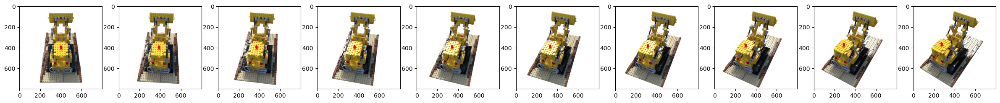

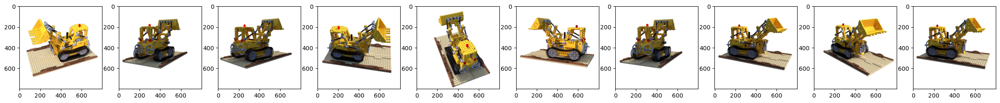

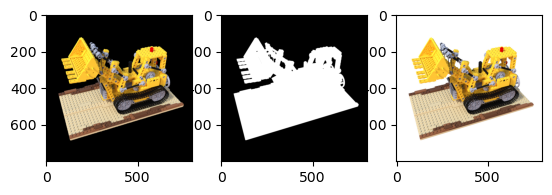

In [7]:
_datadir = "./data/nerf_synthetic/lego"

with open(os.path.join(_datadir, "transforms_test.json"), "r") as fp:
    meta = json.load(fp)

print(str(meta)[:300])

_frames = meta['frames']
_frame = _frames[0]
print(_frame)

_fname = os.path.join(_datadir, _frame['file_path'] + ".png")
print(_fname)

import imageio.v2 as imageio
img = imageio.imread(_fname) # [800, 800, 4 = RGB+mask(synthetic; from Blender)]
print(img.shape)

# NOTE: sequential visualization
import matplotlib.pyplot as plt
fig, axis = plt.subplots(1, 10, figsize=(30, 300))
for i in range(10):
    _frame = _frames[i]
    _fname = os.path.join(_datadir, _frame["file_path"] + ".png")

    img = imageio.imread(_fname)

    axis[i].imshow(img)

# NOTE: random shuffled visualization
import random
random.shuffle(_frames)
fig, axis = plt.subplots(1, 10, figsize=(30, 300))
for i in range(10):
    _frame = _frames[i]
    _fname = os.path.join(_datadir, _frame["file_path"] + ".png")

    img = imageio.imread(_fname)

    axis[i].imshow(img)

# NOTE: decomposed channel visualization
imgs = []
for i in range(10):
    _frame = _frames[i]
    _fname = os.path.join(_datadir, _frame["file_path"] + ".png")

    img = imageio.imread(_fname)
    imgs.append(img)

imgs = (np.array(imgs) / 255.0).astype(np.float32) # [0., 1.]
print(imgs.shape)

imgs_orig = imgs[..., :3] # RGB
imgs_mask = imgs[..., -1] # mask

fig, axis = plt.subplots(1, 3)
axis[0].imshow(imgs_orig[0])
axis[1].imshow(imgs_mask[0], cmap="gray")

# NOTE: how plt operates with mask
imgs = imgs[..., :3] * imgs[..., -1:] + (1-imgs[..., -1:]) # `-1:`: broadcast 
axis[2].imshow(imgs[0])

['./data/nerf_llff_data/fern/images/IMG_4026.JPG', './data/nerf_llff_data/fern/images/IMG_4027.JPG', './data/nerf_llff_data/fern/images/IMG_4028.JPG', './data/nerf_llff_data/fern/images/IMG_4029.JPG', './data/nerf_llff_data/fern/images/IMG_4030.JPG', './data/nerf_llff_data/fern/images/IMG_4031.JPG', './data/nerf_llff_data/fern/images/IMG_4032.JPG', './data/nerf_llff_data/fern/images/IMG_4033.JPG', './data/nerf_llff_data/fern/images/IMG_4034.JPG', './data/nerf_llff_data/fern/images/IMG_4035.JPG', './data/nerf_llff_data/fern/images/IMG_4036.JPG', './data/nerf_llff_data/fern/images/IMG_4037.JPG', './data/nerf_llff_data/fern/images/IMG_4038.JPG', './data/nerf_llff_data/fern/images/IMG_4039.JPG', './data/nerf_llff_data/fern/images/IMG_4040.JPG', './data/nerf_llff_data/fern/images/IMG_4041.JPG', './data/nerf_llff_data/fern/images/IMG_4042.JPG', './data/nerf_llff_data/fern/images/IMG_4043.JPG', './data/nerf_llff_data/fern/images/IMG_4044.JPG', './data/nerf_llff_data/fern/images/IMG_4045.JPG']

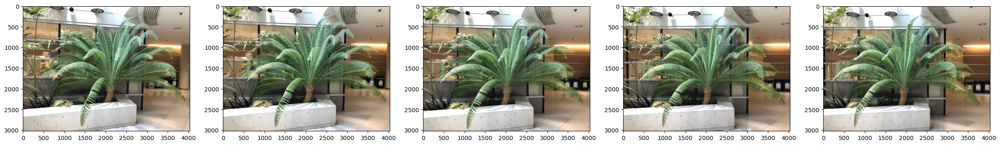

In [8]:
# NOTE: LLFF (real scene) data
# NOTE: challenges in real scene: pose, background (e.g., sky: depth?) etc...

_datadir = "./data/nerf_llff_data/fern"
imgs = [
    os.path.join(_datadir, "images", f) 
    for f 
    in sorted(
        os.listdir(os.path.join(_datadir, "images"))
    )
    if f.endswith(".JPG") or f.endswith(".jpg") or f.endswith(".png")
]
print(imgs)

img = imageio.imread(imgs[0])
print(img.shape)

fig, axis = plt.subplots(1, 5, figsize=(30, 600))
for i in range(5):
    _fname = imgs[i]
    img = imageio.imread(_fname)
    axis[i].imshow(img)

print(len(imgs))

In [9]:
# NOTE: implement data loader
import cv2

# NOTE: synthetic pose generation from spherical coordinate
def pose_spherical(theta, phi, radius):
    """ 
    ### pose_spherical

    Returns camera-to-world matrix
    
    """
    
    # NOTE: WYSIWIG; row-major assignment
    def _trans_radius(r):
        return torch.Tensor([ 
            [1, 0, 0, 0], 
            [0, 1, 0, 0], 
            [0, 0, 1, r], # NOTE: lookat `-r` direction; from `r` to origin
            [0, 0, 0, 1]
        ]).float()

    def _rotate_phi(phi): # NOTE: pitch; right-thumb rule 👍
        return torch.Tensor([
            [1, 0, 0, 0], # NOTE: from X-axis, 
            [0, np.cos(phi), -np.sin(phi), 0], 
            [0, np.sin(phi), np.cos(phi), 0], 
            [0, 0, 0, 1]
        ]).float()

    def _rotate_theta(theta): # NOTE: Y-axis? yaw
        # NOTE: sign of `np.sin` inverted!; means inverted rotation direction (cw~ccw)
        # NOTE: it's up to developer's choice; no need to invert it, but it's convenient
        return torch.Tensor([
            [np.cos(theta), 0, -np.sin(theta), 0], 
            [0, 1, 0, 0], # NOTE: right thumb rule at Y-axis
            [np.sin(theta), 0, np.cos(theta), 0], 
            [0, 0, 0, 1]
        ]).float()


    # NOTE: generate pose
    render_pose = _trans_radius(radius)
    render_pose = _rotate_phi(phi / 180. * np.pi) @ render_pose
    render_pose = _rotate_theta(theta / 180. * np.pi) @ render_pose

    def _cam_to_world(pose):
        return torch.Tensor([
            [-1, 0, 0, 0], # NOTE: invert X-axis
            [0, 0, 1, 0], # NOTE: switch Y<->Z
            [0, 1, 0, 0], # NOTE: switch Z<->Y
            [0, 0, 0, 1]
        ]) @ pose

    # NOTE: c2w: inverse of extrinsic matrix
    return _cam_to_world(render_pose)

# NOTE: implement Blender data loader
def load_blender_data(basedir, half_res=False, testskip=1):
    splits = ["train", "val", "test"]
    metas = {}

    # NOTE: load poses
    for s in splits:
        with open(os.path.join(basedir, f"transforms_{s}.json"), "r") as fp:
            metas[s] = json.load(fp)

    all_imgs = []
    all_poses = []
    counts = [0] # NOTE: start of `train` index
    for s in splits:
        meta = metas[s]
        imgs = []
        poses = []
        if s == "train" or testskip == 0: # NOTE: if `train`, use all frames
            skip = 1
        else:
            skip = testskip

        for frame in meta["frames"][::skip]:
            fname = os.path.join(basedir, frame["file_path"] + ".png")
            imgs.append(imageio.imread(fname))
            poses.append(np.array(frame["transform_matrix"]))

        imgs = (np.array(imgs) / 255.).astype(np.float32) # NOTE: keep all 4 channels
        poses = np.array(poses).astype(np.float32)
        all_imgs.append(imgs)
        all_poses.append(poses)

        counts.append(counts[-1] + imgs.shape[0]) # NOTE: end of each split index
 
    # NOTE: index for each split
    i_split = [np.arange(counts[i], counts[i+1]) for i in range(len(splits))]

    imgs = np.concatenate(all_imgs, 0)
    poses = np.concatenate(all_poses, 0)

    H, W = imgs[0].shape[:2]
    camera_angle_x = float(meta["camera_angle_x"])
    focal_length = 0.5*W / np.tan(camera_angle_x/2.) # NOTE: see handwritten note

    # NOTE: poses for inference/test
    render_poses = torch.stack(
        [
            pose_spherical(theta=angle, phi=-30.0, radius=4.0) 
            for angle
            in np.linspace(-180, 180, 160+1)[:-1]
        ], dim=0
    )

    if True is half_res:
        H = H//2
        W = W//2

        # NOTE: IMPORTANT: change focal length!!!
        focal_length = focal_length/2.

        imgs_half_res = np.zeros((imgs.shape[0], H, W, 4))
        for idx, image in enumerate(imgs):
            imgs_half_res[i] = cv2.resize(img, (W, H), interpolation=cv2.INTER_AREA)
        imgs = imgs_half_res


    return imgs, poses, render_poses, [H, W, focal_length], i_split


In [10]:
# NOTE: implement LLFF data loader

def normalize(x):
    # https://github.com/Fyusion/LLFF/blob/c6e27b1ee59cb18f054ccb0f87a90214dbe70482/llff/math/pose_math.py#L11
    return x / np.linalg.norm(x)

def viewmatrix(z, up, pos):
    # https://github.com/Fyusion/LLFF/blob/c6e27b1ee59cb18f054ccb0f87a90214dbe70482/llff/math/pose_math.py#L14
    """
    ### viewmatrix

    The rest vector is determined by given two vectors: `z` & `up`
    """
    vec2 = normalize(z)
    vec1_avg = up
    vec0 = normalize(np.cross(vec1_avg, vec2))
    vec1 = normalize(np.cross(vec2, vec0))
    m = np.stack([vec0, vec1, vec2, pos], axis=1)
    return m

def poses_avg(poses, idx: int = -1):
    # https://github.com/Fyusion/LLFF/blob/c6e27b1ee59cb18f054ccb0f87a90214dbe70482/llff/math/pose_math.py#L22
    """
    ### poses_avg

    :param poses: poses
    :param idx: if specified, corresponding pose is used instead of average
    """

    hwf = poses[0, :3, -1:]

    if 0 <= idx: # NOTE: if `idx` is specified,
        return poses[idx, ...]
    else:    
        center = poses[:, :3 ,3].mean(0)
        vec2 = normalize(poses[:, :3, 2].sum(0))
        up = poses[:, :3, 1].sum(0)
            
        c2w = np.concatenate([viewmatrix(vec2, up, center), hwf], axis=1)
        return c2w

def render_path_spiral(c2w, up, rads, focal, zdelta, zrate, rots, N):
    # https://github.com/Fyusion/LLFF/blob/c6e27b1ee59cb18f054ccb0f87a90214dbe70482/llff/math/pose_math.py#L56

    render_poses = []
    rads = np.array(list(rads) + [1.0])
    hwf = c2w[:, 4:5]

    for theta in np.linspace(0.0, 2.0 * np.pi * rots, N+1)[:-1]:
        c = np.dot(
            c2w[:3, :4], 
            np.array([np.cos(theta), -np.sin(theta), -np.sin(theta*zrate), 1.0]) * rads
        )
        z = normalize(
            c - np.dot(c2w[:3, :4], np.array([0, 0, -focal, 1.0]))
        )
        render_poses.append(np.concatenate([viewmatrix(z, up, c), hwf], axis=1))

    return render_poses


def recenter_poses(poses):
    """
    ### recenter_poses

    """

    poses_ = poses + 0
    bottom = np.reshape([0, 0, 0, 1.], [1, 4])
    c2w = poses_avg(poses)
    c2w = np.concatenate([c2w[:3, :4], bottom], axis=-2)
    bottom = np.tile(
        np.reshape(bottom, [1, 1, 4]), 
        [poses.shape[0], 1, 1]
    )
    poses = np.concatenate([
        poses[:, :3, :4], 
        bottom
    ], axis=-2)

    poses = np.linalg.inv(c2w) @ poses
    poses_[:, :3, :4] = poses[:, :3, :4]
    poses = poses_
    return poses

def _minify(basedir, factors=[], resolutions=[]):
    """
    ### _minify


    """

    # NOTE: check if downsampled images are already generated
    need_to_load = False
    for r in factors:
        imgdir = os.path.join(basedir, f"images_{r}")
        if not os.path.exists(imgdir):
            need_to_load = True
    for r in resolutions:
        imgdir = os.path.join(basedir, f"images_{r[1]}x{r[0]}")
        if not os.path.exists(imgdir):
            need_to_load = True
    if not need_to_load:
        return
    
    # NOTE: if not exist, generate
    from shutil import copy
    from subprocess import check_output

    imgdir = os.path.join(basedir, "images")
    imgs = [
        os.path.join(imgdir, f) 
        for f in sorted(os.listdir(imgdir))
    ]
    imgs = [
        f for f in imgs
        if any([f.endswith(ext) for ext in ["JPG", "jpg", "PNG", "png", "jpeg"]])
    ]
    imgdir_orig = imgdir

    wd = os.getcwd()

    for r in factors + resolutions:
        # NOTE: set resized image filename
        if isinstance(r, int):
            name = f"images_{r}"
            resizearg = f"{100./r}%"
        else:
            name = f"images_{r[1]}x{r[0]}"
            resizearg = f"{r[1]}x{r[0]}"
        
        imgdir = os.path.join(basedir, name)
        if os.path.exists(imgdir):
            continue

        print(f"[DEBUG] Minifying {r}, {basedir=}")

        # NOTE: first, copy original image files
        os.makedirs(imgdir)
        check_output(f"cp {imgdir_orig}/* {imgdir}", shell=True)

        # NOTE: second, resize it using `mogrify` (NOTE: apt-get install imagemagick)
        ext = imgs[0].split(".")[-1]
        args = " ".join(
            ["mogrify", "-resize", resizearg, "-format", "png", f"*.{ext}"]
        )
        print(args)
        os.chdir(imgdir)
        check_output(args, shell=True)
        os.chdir(wd)

        if ext != "png":
            check_output(f"rm {imgdir}/*.{ext}", shell=True)
            print(f"[DEBUG] Removed duplicates")

        print(f"[DEBUG] Done.")

    return

def _load_data(basedir, factor=None, width=None, height=None, load_imgs=True):
    """
    ### _load_data

    Loads real scene data
    """

    poses_arr = np.load(os.path.join(basedir, "poses_bounds.npy")) # NOTE: `poses_bounds.npy`: COLMAP generated, total 17D
    poses = poses_arr[:, :-2].reshape([-1, 3, 5]).transpose([1, 2, 0]) # 15D?
    bds = poses_arr[:, -2:].transpose([1, 0]) # NOTE: near & far


    # NOTE: determine which downsampled option will be used or images option applied loaded
    img0 = [
        os.path.join(basedir, "images", f)
        for f in sorted(os.listdir(os.path.join(basedir, "images")))
        if f.endswith("JPG") or f.endswith("jpg") or f.endswith("png")
    ][0]
    img_shape = imageio.imread(img0).shape

    sfx = ""
    if factor is not None:
        factor = factor
        _minify(basedir, factors=[factor])
        sfx = f"_{factor}"
    elif height is not None:
        factor = img_shape[0] / float(height)
        width = int(img_shape[1] / factor)
        _minify(basedir, resolutions=[[height, width]])
        sfx = f"_{width}x{height}"
    elif width is not None:
        factor = img_shape[1] / float(width)
        height = int(img_shape[0] / factor)
        _minify(basedir, resolutions=[[height, width]])
        sfx = f"_{width}x{height}"
    else:
        factor = 1

    # NOTE: load images based on `suffix`
    imgdir = os.path.join(basedir, "images" + sfx)
    if not os.path.exists(imgdir):
        print(f"[ERROR] {imgdir} does not exist, returning")
        return
    imgfiles = [
        os.path.join(imgdir, f)
        for f in sorted(os.listdir(imgdir))
        if f.endswith("JPG") or f.endswith("jpg") or f.endswith("png")
    ]
    if poses.shape[-1] != len(imgfiles):
        print(f"[ERROR] Mismatch between imgs {len(imgfiles)} and poses {poses.shape[-1]} !!!!")
        return
    
    # NOTE: reconfigure focal length based on resized image
    img_shape_resized = imageio.imread(imgfiles[0]).shape
    poses[:2, 4, :] = np.array(img_shape_resized[:2]).reshape([2, 1])
    poses[2, 4, :]  = poses[2, 4, :] * 1./factor

    if not load_imgs:
        return poses, bds
    
    def imread(f):
        if f.endswith("png"):
            # return imageio.imread(f, ignoregamma=True) # NOTE: legacy?
            return imageio.imread(f)
        else:
            return imageio.imread(f)
    imgs = [
        imread(f)[..., :3] / 255.
        for f in imgfiles
    ]
    imgs = np.stack(imgs, axis=-1)    
    

    print(f"[DEBUG] Loaded image data {imgs.shape}, {poses[:, -1, 0]}")
    return poses, bds, imgs


def load_llff_data(basedir, factor=8, recenter=True, bd_factor=0.75, spherify=False, path_zflat=False):

    # NOTE: `bd`: boundary
    poses, bds, imgs = _load_data(basedir, factor=factor)
    print(f"[DEBUG] Loaded {basedir}, {bds.min()}, {bds.max()}")

    # NOTE: correct rotation matrix 
    poses = np.concatenate(
        [
            poses[:, 1:2, :], 
            -poses[:, 0:1, :], 
            poses[:, 2:, :]
        ], axis=1
    )
    # NOTE: move variable dim to axis 0
    poses = np.moveaxis(poses, -1, 0).astype(np.float32)
    imgs = np.moveaxis(imgs, -1, 0).astype(np.float32)
    images = imgs
    bds = np.moveaxis(bds, -1, 0).astype(np.float32)

    # NOTE: rescale if `bd_factor` is provided
    sc = 1. if bd_factor is None else 1. / (bds.min() * bd_factor)
    poses[:, :3, 3] *= sc
    bds *= sc

    if recenter:
        poses = recenter_poses(poses)
        
    if spherify:
        #poses, render_poses, bds = spehrify_poses(poses, bds)
        pass

    else:
        # TODO: 23/06/06 manual pose selection
        c2w = poses_avg(poses, 1)
        print(f"[DEBUG] recentered {c2w.shape=}")
        print(c2w[:3, :4])

        # NOTE: get spiral trajectory
        # NOTE: get average pose
        up = normalize(poses[:, :3, 1].sum(0))

        # https://github.com/Fyusion/LLFF/blob/c6e27b1ee59cb18f054ccb0f87a90214dbe70482/llff/math/pose_math.py#L72
        # NOTE: find a reasonable "focus depth" for this dataset
        close_depth, inf_depth = bds.min() * 0.9, bds.max() * 5.0
        dt = 0.75
        mean_dz = 1. / ((1. - dt)/close_depth + dt/inf_depth)
        focal = mean_dz

        # NOTE: get radii for spiral path
        shrink_factor = 0.8
        zdelta = close_depth * 0.2
        tt = poses[:, :3, 3]
        rads = np.percentile(np.abs(tt), 90, axis=0)
        c2w_path = c2w
        N_views = 240
        N_rots = 2
        if path_zflat:
            zloc = -close_depth * 0.1
            c2w_path[:3, 3] = c2w_path[:3, 3] + zloc * c2w_path[:3, 2]
            rads[2] = 0.0
            N_rots = 1
            N_views /= 2

        # NOTE: generate spiral path
        render_poses = render_path_spiral(c2w_path, up, rads, focal, zdelta, zrate=0.5, rots=N_rots, N=N_views)

    render_poses = np.array(render_poses).astype(np.float32)

    
    print(f"[DEBUG] Data: ")
    print(poses.shape, images.shape, bds.shape)

    # NOTE: select the most similar view w/ average pose w.r.t translation
    c2w = poses_avg(poses)
    dists = np.sum(np.square(c2w[:3, 3] - poses[:, :3, 3]), axis=-1)
    i_test = np.argmin(dists)
    print(f"[DEBUG] HOLDOUT view is {i_test}")

    images = images.astype(np.float32)
    poses = poses.astype(np.float32)

    return images, poses, bds, render_poses, i_test

In [11]:
# NOTE: ray tracing - toy example

W = 5
H = 4
# print(torch.linspace(0, W-1, W))
# print(torch.linspace(0, H-1, H))
i, j = torch.meshgrid(torch.linspace(0, W-1, W), torch.linspace(0, H-1, H))
i = i.t()
j = j.t()
print(i)
print(j)

grid = torch.stack([i, j], dim=-1)
print(grid[0, 1])

tensor([[0., 1., 2., 3., 4.],
        [0., 1., 2., 3., 4.],
        [0., 1., 2., 3., 4.],
        [0., 1., 2., 3., 4.]])
tensor([[0., 0., 0., 0., 0.],
        [1., 1., 1., 1., 1.],
        [2., 2., 2., 2., 2.],
        [3., 3., 3., 3., 3.]])
tensor([1., 0.])


/root/anaconda3/envs/augmented_safeguard/lib/python3.8/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1678402421473/work/aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [12]:
# NOTE: ray tracing helpers

def get_rays(H, W, K, c2w):
    """
    ### get_rays

    Given pose `c2w` and intrinsics `H`, `W`, `K`, 
    returns (origin, directions) of ray for each pixels in woord coordinate
    """

    i, j = torch.meshgrid(
        torch.linspace(0, W-1, W), 
        torch.linspace(0, H-1, H)
    ) # NOTE: W*H, thus transpose required
    i = i.t()
    j = j.t()

    # NOTE: stack to generate ray direction
    # NOTE: IMPORTANT: generate rays in NDC coordinate!
    fx = K[0][0]
    fy = K[1][1] # NOTE: in NeRF, fx == fy
    cx = K[0][2]
    cy = K[1][2]
    dirs = torch.stack([
        (i-cx)/fx, 
        -(j-cy)/fy, # NOTE: image coord -> NDC coord 
        -torch.ones_like(i) # NOTE: lookat: -Z direction
    ], dim=-1) # NOTE: (H, W, 3)

    
    print(f"[DEBUG] in vanilla.get_rays(); {c2w.shape=}")
    print(f"[DEBUG] in vanilla get_rays(); {dirs.shape=}")

    # NOTE: convert NDC `dirs` to world coord
    rays_d = torch.sum(dirs[..., np.newaxis, :] * c2w[:3, :3], dim=-1) # NOTE: is identical to: c2w @ dirs | c2w.dot(dirs)

    rays_o = c2w[:3, -1].expand(rays_d.shape)

    return rays_o, rays_d

def get_rays_np(H, W, K, c2w):
    """
    ### get_rays_np

    `numpy` implementation of `get_rays(...)`
    """

    i, j = np.meshgrid(
        np.arange(W, dtype=np.float32), 
        np.arange(H, dtype=np.float32), 
        indexing="xy" # NOTE: thus no need to transpose `i` and `j`
    )

    fx = K[0][0]
    fy = K[1][1] # NOTE: in NeRF, fx == fy
    cx = K[0][2]
    cy = K[1][2]
    dirs = np.stack([
        (i-cx)/fx, 
        -(j-cy)/fy, 
        -np.ones_like(i)
    ], axis=-1)

    rays_d = np.sum(dirs[..., np.newaxis, :] * c2w[:3, :3], axis=-1)
    rays_o = np.broadcast_to(c2w[:3, -1], np.shape(rays_d))

    return rays_o, rays_d


# NOTE: NDC ray space
def ndc_rays(H, W, focal, near, rays_o, rays_d):
    """
    ### ndc_rays


    """

    # NOTE: shift ray origins to near plane (z=-n) (following last paragraph in Appendix. C)
    t_n = -(near + rays_o[..., 2]) / rays_d[..., 2]
    rays_o = rays_o + t_n[..., None] * rays_d

    # NOTE: equation (25)
    o0 = (-1. * focal / (0.5*W)) * (rays_o[..., 0] / rays_o[..., 2])
    o1 = (-1. * focal / (0.5*H)) * (rays_o[..., 1] / rays_o[..., 2])
    o2 = (1. + 2.*near / rays_o[..., 2])

    # NOTE: equation (26)
    d0 = (-1. * focal / (0.5*W)) * (rays_d[..., 0]/rays_d[..., 2] - rays_o[..., 0]/rays_o[..., 2])
    d1 = (-1. * focal / (0.5*H)) * (rays_d[..., 1]/rays_d[..., 2] - rays_o[..., 1]/rays_o[..., 2])
    d2 = -2. * near * (1. / rays_o[..., 2])

    rays_o = torch.stack([o0, o1, o2], dim=-1)
    rays_d = torch.stack([d0, d1, d2], dim=-1)
    return rays_o, rays_d



In [13]:
# NOTE: positional embedding


class PositionalEmbedder:
    def __init__(self, **kwargs) -> None:
        self.kwargs = kwargs
        self.create_embedding_func()

    def create_embedding_func(self):
        embed_funcs = [] # NOTE: to store embedding functions with different octaves

        in_dim = self.kwargs["input_dims"]
        out_dim = 0 # we will find this later

        # NOTE: concat input to layer output; L=60->63
        # TODO: does it for feeding input position in the middle layer???
        if self.kwargs["include_input"]: 
            embed_funcs.append(lambda x: x) # input as output
            out_dim += in_dim # dimension as well
            
        # NOTE: octaves
        max_freq = self.kwargs["max_freq_log2"] # NOTE: L-1
        N_freqs = self.kwargs["num_freqs"] # NOTE: L(octave)

        # NOTE: sampling: log or linear
        if self.kwargs["log_sampling"]:
            freq_bands = 2.**torch.linspace(0.0, max_freq, steps=N_freqs) # **: power; exponential stepping
        else: # NOTE: though linear sampling is not used, but exists in the original code
            freq_bands = torch.linspace(2.**0, 2.**max_freq, steps=N_freqs) # linear stepping

        # NOTE: generate embedding
        for freq in freq_bands:
            for periodic_func in self.kwargs["periodic_funcs"]:
                embed_funcs.append(
                    lambda x, periodic_func=periodic_func, freq=freq: periodic_func(x * freq)
                )
                out_dim += in_dim

        self.embed_funcs = embed_funcs
        self.out_dim = out_dim

    def embed(self, inputs):
        # NOTE: Returns position-embedded `inputs`
        return torch.cat([
            embed_func(inputs)
            for embed_func 
            in self.embed_funcs
        ], dim=-1)
        

def get_embedder(L, i=0): # TODO: refactor `i` to boolean; use_embedding
    """
    ### get_embedder

    Wrapping function for `Embedder.create_embedding_func(...)`

    For each model creation, TODO: write details
    As we need embedding functions with different octaves for each input type 
    (whether position:L=10 or direction:L=4)
    """

    if L == -1:
        return nn.Identity(), 3


    embed_kwargs = {
        "include_input": True, 
        "input_dims": 3, 
        "max_freq_log2": L-1, 
        "num_freqs": L, 
        "log_sampling": True, 
        "periodic_funcs": [torch.sin, torch.cos],
    }

    embedder_obj = PositionalEmbedder(**embed_kwargs)
    embedded_result = lambda x, eo=embedder_obj: eo.embed(x)

    return embedded_result, embedder_obj.out_dim

In [14]:
# NOTE: test `get_embedder`; if L == 10 -> out_dim == 63
embed, out_dim = get_embedder(10, 0)
print(embed)
print(out_dim)

input = torch.zeros(3)
output = embed(input)
print(input)
print(output)


# NOTE: view direction
embed, out_dim = get_embedder(4)
print(embed)
print(out_dim) # 3+24
output = embed(input)
print(input)
print(output)

<function get_embedder.<locals>.<lambda> at 0x7fe46551a5e0>
63
tensor([0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0.,
        1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0.,
        1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0.,
        1., 1., 1., 0., 0., 0., 1., 1., 1.])
<function get_embedder.<locals>.<lambda> at 0x7fe46551ab80>
27
tensor([0., 0., 0.])
tensor([0., 0., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 1., 1., 1., 0., 0., 0.,
        1., 1., 1., 0., 0., 0., 1., 1., 1.])


In [15]:
# NOTE: NeRF implementation

# NOTE: from https://github.com/NVlabs/FUNIT/issues/23#issuecomment-1063118028
def my_relu(x):
    return torch.maximum(x, torch.zeros_like(x))

class NeRF(nn.Module):
    def __init__(self, 
        D=8, # layder depth
        W=256, # layer width (dimension)
        input_ch=3, 
        input_ch_views=3, 
        output_ch=4,
        skips=[4],
        use_viewdirs=False 
    ) -> None:
        """
        
        """
        super().__init__()

        self.D = D
        self.W = W
        self.input_ch = input_ch
        self.input_ch_views = input_ch_views
        self.skips = skips
        self.use_viewdirs = use_viewdirs


        # NOTE: layers
        self.pts_linears = nn.ModuleList(
            [
                nn.Linear(input_ch, W)
            ] + 
            [
                nn.Linear(W, W) if i not in self.skips 
                else nn.Linear(W+input_ch, W) 
                for i in range(D-1)
            ]
        )
        self.views_linears = nn.ModuleList([
            nn.Linear(input_ch_views+W, W//2) # i.e., 128
        ])
        
        if use_viewdirs:
            self.feature_linear = nn.Linear(W, W)
            self.alpha_linear = nn.Linear(W, 1) # NOTE: density
            self.rgb_linear = nn.Linear(W//2, 3) # NOTE: input from `direction_linears`
        else:
            # NOTE: RGB+density inference without view direction condition
            self.output_linear = nn.Linear(W, output_ch) 


    def forward(self, x):
        # NOTE: split input into original/feature, 


        input_pts, input_views = torch.split(
            x, 
            [self.input_ch, self.input_ch_views], 
            dim=-1
        ) # (Batch, 63), (Batch, 27)
        h = input_pts

        # NOTE: Position layers (with input feeding in the middle layer)
        for idx, layer in enumerate(self.pts_linears):
            
            h = self.pts_linears[idx](h)

            # NOTE: we're not going to implement activation in the layer function, thus implement in here
            h = F.relu(h)
            # h = my_relu(h)

            # NOTE: be sure to concat input on 5th(idx==4) layer!
            if idx in self.skips:
                h = torch.cat([input_pts, h], dim=-1) # (Batch, 63+256)


        # NOTE: Direction layers (the length should be 1, as there is only a single layer)
        if self.use_viewdirs:            
            alpha = self.alpha_linear(h) # NOTE: infer density on the last layer
            feature = self.feature_linear(h) # NOTE: last layer: FCN with direction
            h = torch.cat([feature, input_views], dim=-1)

            for idx, layer in enumerate(self.views_linears):
                h = self.views_linears[idx](h)
                h = F.relu(h)
                # h = my_relu(h)


            # NOTE: RGB layer
            rgb = self.rgb_linear(h)
            outputs = torch.cat([rgb, alpha], dim=-1)
        else:
            outputs = self.output_linear(h)

        return outputs

In [16]:
# NOTE: NeRF model validation

input = torch.rand(1, 3) # batch, RGB
input_dir = torch.rand(1, 3)

# NOTE: input -> positional embedding -> NeRF
embed, out_dim = get_embedder(10)
embed_dir, out_dim_dir = get_embedder(4)
model = NeRF(input_ch=out_dim, input_ch_views=out_dim_dir, use_viewdirs=True)

print(input)
print(input_dir)
emb_input = embed(input)
emb_input_dir = embed_dir(input_dir)
print(emb_input)
print(emb_input_dir)

# NOTE: input on NeRF: concat pos+dir
x = torch.cat([emb_input, emb_input_dir], dim=-1)
out = model(x)

print(out)

tensor([[0.2908, 0.6634, 0.8887]])
tensor([[0.8964, 0.0439, 0.6974]])
tensor([[ 0.2908,  0.6634,  0.8887,  0.2867,  0.6158,  0.7763,  0.9580,  0.7879,
          0.6304,  0.5493,  0.9704,  0.9787,  0.8356,  0.2415, -0.2051,  0.9180,
          0.4687, -0.4015,  0.3965, -0.8833, -0.9158,  0.7280, -0.8281,  0.7355,
         -0.6856,  0.5606,  0.6775, -0.9982, -0.9284,  0.9966, -0.0599, -0.3715,
         -0.0819,  0.1195,  0.6898, -0.1633, -0.9928, -0.7240, -0.9866, -0.2373,
         -0.9988,  0.3221,  0.9714,  0.0485,  0.9467, -0.4611, -0.0968,  0.6099,
          0.8873, -0.9953,  0.7925, -0.8183,  0.1927,  0.9667,  0.5747,  0.9813,
          0.2560, -0.9406,  0.3782,  0.4950, -0.3394,  0.9257, -0.8689]])
tensor([[ 0.8964,  0.0439,  0.6974,  0.7811,  0.0439,  0.6422,  0.6244,  0.9990,
          0.7665,  0.9755,  0.0876,  0.9846, -0.2201,  0.9962,  0.1751, -0.4295,
          0.1746,  0.3447, -0.9031,  0.9846, -0.9387,  0.7757,  0.3438, -0.6472,
          0.6311,  0.9391,  0.7623]])
tensor([

In [17]:
# NOTE: batchfy: func that returns func

def batchify(fn, chunk):
    """
    
    Constructs a version of `fn` that applies to similar batches
    Why? Directly computing [N_rays*N_samples]-sized tensor often causes OOM
    thus we split into `chunk`-size and train&infer the network
    """

    if chunk is None:
        return fn
    
    def ret(inputs):
        return torch.cat(
            [
                fn(inputs[i:i+chunk])
                for i
                in range(0, inputs.shape[0], chunk) 
            ], dim=0 # NOTE: concat to batch dimension
        )
    return ret

In [18]:
# NOTE: helper function to running network

def run_network(
    inputs, 
    viewdirs, 
    fn,         # NeRF
    embed_fn,   # Positional Embedding
    embeddirs_fn, # Directional Embedding
    netchunk=1024*64):

    # NOTE: inputs: [N_rays (possibly W*H), N_samples (ray marching), 3]
    inputs_flat = torch.reshape(inputs, [-1, inputs.shape[-1]]) # flatten except for channels
    embedded = embed_fn(inputs_flat)

    if viewdirs is not None:
        # NOTE: viewdirs: [N_rays, 3]; for all ray segments direction is identical
        
        # viewdirs[:, None] # [N_rays, 1, 3]
        # viewdirs[:, None].expand(inputs.shape) # [N_rays, N_samples, 3]
        input_dirs = viewdirs[:, None].expand(inputs.shape)
        input_dirs_flat = torch.reshape(input_dirs, [-1, input_dirs.shape[-1]])

        embedded_dirs = embeddirs_fn(input_dirs_flat)

        # NOTE: concat with pos
        embedded = torch.cat([embedded, embedded_dirs], dim=-1)

    outputs_flat = batchify(fn, netchunk)(embedded) # run network
    outputs = torch.reshape(
        outputs_flat, 
        list(inputs.shape[:-1]) + [outputs_flat.shape[-1]]
    ) # NOTE: flatten to original shape: [N_rays, N_samples, output_ch=4]

    return outputs

In [19]:
# NOTE: wrapper for entire training

def create_NeRF(args):

    embed_fn, input_ch = get_embedder(args.multires, args.i_embed) # L=10, i=0

    input_ch_views = 0
    embeddirs_fn = None
    if args.use_viewdirs:
        embeddirs_fn, input_ch_views = get_embedder(args.multires_views, args.i_embed)

    # NOTE: importance sampling (hierarchical sampling)
    # NOTE: coarse NeRF + fine NeRF (based on coarse NeRF weights)
    # NOTE: where weight: transmittance * occupancy
    output_ch = 5 if args.N_importance>0 else 4

    # NOTE: instantiate NeRF models
    skips = [4]
    # NOTE: coarse NeRF
    model = NeRF(
        D=args.netdepth, 
        W=args.netwidth, 
        input_ch=input_ch,
        output_ch=output_ch, 
        skips=skips,
        input_ch_views=input_ch_views,
        use_viewdirs=args.use_viewdirs,
    ).to(device)
    grad_vars = list(model.parameters()) # NOTE: feeded to an optimizer

    # NOTE: fine NeRF
    # NOTE: sample more where weight on coarse network is high, and vice versa
    model_fine = None
    if args.N_importance>0:
        model_fine = NeRF(
            D=args.netdepth_fine,
            W=args.netwidth_fine, 
            input_ch=input_ch,
            output_ch=output_ch,
            skips=skips,
            input_ch_views=input_ch_views,
            use_viewdirs=args.use_viewdirs,
        ).to(device)
        grad_vars += list(model_fine.parameters())

    # NOTE: wrapper for `run_network(...)`; as embedding functions won't change
    network_query_fn = lambda inputs, viewdirs, network_fn: run_network(
        inputs, viewdirs, 
        network_fn, 
        embed_fn=embed_fn, embeddirs_fn=embeddirs_fn, 
        netchunk=args.netchunk
    )

    
    # NOTE: create optimizer
    optimizer = torch.optim.Adam(params=grad_vars, lr=args.lrate, betas=(0.9, 0.999))

    start = 0
    basedir = args.basedir
    expname = args.expname


    #######################

    # NOTE: load checkpoints
    if args.ft_path is not None and args.ft_path != "None":
        ckpts = [args.ft_path]
    else:
        ckpts = [
            os.path.join(basedir, expname, f)
            for f
            in sorted(
                os.listdir(os.path.join(basedir, expname))
            )
            if "tar" in f
        ]

    print(f"[DEBUG] Found ckpts: {ckpts}")

    if len(ckpts) > 0 and not args.no_reload:
        ckpt_path = ckpts[-1] # NOTE: the latest checkpoint
        print(f"[DEBUG] Reloading from {ckpt_path}")
        ckpt = torch.load(ckpt_path)
    
        start = ckpt["global_step"] # NOTE: update starting step
        optimizer.load_state_dict(ckpt["optimizer_state_dict"])

        # NOTE: load model
        model.load_state_dict(ckpt["network_fn_state_dict"])
        if model_fine is not None:
            model_fine.load_state_dict(ckpt["network_fine_state_dict"])

    #######################

    render_kwargs_train = {
        "network_query_fn": network_query_fn, 
        "perturb": args.perturb, 
        "N_importance": args.N_importance, # NOTE: amount of sampling positions from PDF generated from coarse NeRF, generally 128
        "network_fine": model_fine, 
        "N_samples": args.N_samples, # NOTE: amount of sampling positions uniformly in order to estimate PDF in coarse NeRF, generally 64
        "network_fn": model, 
        "use_viewdirs": args.use_viewdirs, 
        "white_bkgd": args.white_bkgd, 
        "raw_noise_std": args.raw_noise_std, # NOTE: prevent overfitting when training
    }

    # NOTE: NDC is effective only for LLFF-style forward facing data
    if args.dataset_type != "llff" or args.no_ndc:
        print(f"[DEBUG] No NDC!")

        render_kwargs_train["ndc"] = False
        render_kwargs_train["lindisp"] = args.lindisp

    render_kwargs_test = {
        k: render_kwargs_train[k]
        for k in render_kwargs_train
    }
    render_kwargs_test["perturb"] = False
    render_kwargs_test["raw_noise_std"] = 0.

    # NOTE: try patch from https://github.com/pytorch/pytorch/issues/80809#issuecomment-1173481031
    optimizer.param_groups[0]["capturable"] = True

    return render_kwargs_train, render_kwargs_test, start, grad_vars, optimizer



In [20]:
# NOTE: volumetric rendering

def raw2outputs(
    raw, 
    z_vals, 
    rays_d, 
    raw_noise_std=0, 
    white_bkgd=False, 
    pytest=False
):
    """
    ### raw2outputs

    Transforms model's predictions into semantically meaningful values

    Arguments: 
        - `raw`: [num_rays, num_samples, 4]; prediction from model i.e., [B, N_samples, RGB+(score i.e., logit value of)density]
        - `z_vals`: [num_rays, num_samples]; integration time
        - `rays_d`: [num_rays, 3]; direction of each ray

    Returns: 
        - `rgb_map`: [num_rays, 3]; estimated RGB color of a ray
        - `disp_map`: [num_rays]; disparity map i.e., inverse of depth map
        - `acc_map`: [num_rays]; sum of weights, along each ray
        - `weights`: [num_rays, num_samples]; weights assigned to each sampled color
        - `depth_map`: [num_rays]; estimated distance to object
    """

    # NOTE: equation 3
    # NOTE: dists: distance between two consecutive sampled positions
    raw2alpha = lambda raw, dists, activation_fn=F.relu: 1.0 - torch.exp(-activation_fn(raw) * dists)
    # raw2alpha = lambda raw, dists, activation_fn=my_relu: 1.0 - torch.exp(-activation_fn(raw) * dists)

    # NOTE: `dists` == delta distances between sampled positions
    dists = z_vals[..., 1:] - z_vals[..., :-1] # NOTE: dim: [N_rays, N_samples-1]
    dists = torch.cat(
        [dists, torch.Tensor([1e10]).expand(dists[..., :1].shape)], 
        dim=-1
    ) # NOTE: append infinite value; dim: [N_rays, N_samples]

    # NOTE: rotate `dists` w.r.t. ray direction
    dists = dists * torch.norm(rays_d[..., None, :], dim=-1)

    # NOTE: color
    rgb = torch.sigmoid(raw[..., :3]) # NOTE: ensure positive color value
    
    # NOTE: compensate overfitting on density score value `alpha`
    noise = 0.0
    if raw_noise_std > 0.0:
        noise = torch.randn(raw[..., 3].shape) * raw_noise_std
    alpha = raw2alpha(raw[..., 3] + noise, dists)

    # NOTE: final density `weight`: transmittance * alpha
    # transmittance = torch.cumprod(
    #     torch.cat(
    #         [
    #             torch.ones((alpha.shape[0], 1)), # NOTE: at first no object, hence 0
    #             1.0-alpha+1e-10 # NOTE: privent NaN
    #         ], 
    #         dim=-1
    #     ), 
    #     dim=-1
    # )
    # weights = alpha * transmittance[:, :-1]
    weights = alpha * torch.cumprod(torch.cat([torch.ones((alpha.shape[0], 1)), 1.-alpha + 1e-10], -1), -1)[:, :-1]

    # NOTE: map generation based on `weights`
    rgb_map = torch.sum(weights[..., None] * rgb, dim=-2)
    depth_map = torch.sum(weights * z_vals, dim=-1)
    disp_map = 1.0 / torch.max(
        1e-10 * torch.ones_like(depth_map), 
        depth_map / torch.sum(weights, dim=-1)
    ) # NOTE: inverse normalized `depth_map`
    acc_map = torch.sum(weights, dim=-1)    

    return rgb_map, disp_map, acc_map, weights, depth_map

In [21]:
# NOTE: torch.searchsorted for hierarchical sampling

sorted_sequence = torch.tensor([[1, 3, 5, 7, 9], [2, 4, 6, 8 ,10]]) # NOTE: each row (last dimension) should be sorted in order to use torch.searchsorted
values = torch.tensor([[3, 6, 9], [3, 6, 9]]) # kinda query

torch.searchsorted(sorted_sequence, values) # side='right', default='left'
"""
result size == values.shape
result == ceil(the closest index)
"""

'\nresult size == values.shape\nresult == ceil(the closest index)\n'

In [22]:
# NOTE: torch.gather for hierarchical sampling

t = torch.tensor([[1, 2], [3, 4]])
out = torch.gather(t, dim=1, index=torch.tensor([[0, 0], [1, 0]]))
print(out) # NOTE: returns queried value given `index`

tensor([[1, 1],
        [4, 3]])


In [23]:
# NOTE: hierarchical sampling (section 5.2)
def sample_pdf(
    bins, # `z_vals_mid`
    weights, # from coarse model
    N_samples, # N_importance
    det=False, # if True, deterministic (no perturb)
    pytest=False
):
    """
    ### sample_pdf

    Generate more samples around points, where corresponding `weights` is high
    """

    # NOTE: get pdf
    # FIXME: in-place operations?!
    # weights += 1e-5 # NOTE: prevent NaN where weight == 0.0
    weights = weights + 1e-5
    pdf = weights / torch.sum(weights, dim=-1, keepdim=True) # NOTE: dim: [B, len(bins)-1]
    # NOTE: sampling is done using inverse cdf
    cdf = torch.cumsum(pdf, dim=-1)
    cdf = torch.cat(
        [torch.zeros_like(cdf[..., :1]), cdf], 
        dim=-1
    ) # NOTE: dim: [B, len(bins)]; first cdf is zero

    if det:
        u = torch.linspace(0.0, 1.0, steps=N_samples)
        u = u.expand(list(cdf.shape[:-1]) + [N_samples])
    else:
        u = torch.rand(list(cdf.shape[:-1]) + [N_samples]) # NOTE: dim: [B, len(N_samples)]

    # NOTE: pytest; overwrite `u` with numpy's fixed random numbers
    if pytest:
        np.random.seed(0)
        new_shape = list(cdf.shape[:-1]) + [N_samples]
        if det:
            u = np.linspace(0.0, 1.0, steps=N_samples)
            u = np.broadcast_to(u, new_shape)
        else:
            u = np.random.rand(*new_shape)
        u = torch.Tensor(u)

    # NOTE: inverse cdf; uniform sampling on Y-axis returns importanced sampled X-axis
    u = u.contiguous() # NOTE: reset view of `u` identical to memory layout
    inds = torch.searchsorted(cdf, u, right=True) # NOTE: returns index of bin i.e., `z_vals_mid` corresponds to `cdf`
    # NOTE: calculate exact inverse cdf
    # TODO: clarify this!!!
    lower_bound = torch.max(torch.zeros_like(inds-1), inds-1)
    upper_bound = torch.min((cdf.shape[-1]-1) * torch.ones_like(inds), inds)
    inds_g = torch.stack([lower_bound, upper_bound], dim=-1) # NOTE: dim: [B, N_samples, 2]

    # NOTE: gather indices, in terms of grid?
    matched_shape = [inds_g.shape[0], inds_g.shape[1], cdf.shape[-1]] # NOTE: dim: [B, N_samples, len(bins)]
    cdf_g = torch.gather(cdf.unsqueeze(1).expand(matched_shape), dim=2, index=inds_g)
    bins_g = torch.gather(bins.unsqueeze(1).expand(matched_shape), dim=2, index=inds_g)

    # NOTE: get exact importance-sampled position, by parameterizing `bins_g` w.r.t. `u`
    denom = cdf_g[..., 1] - cdf_g[..., 0] # NOTE: upper_bound cdf - lower_bound cdf
    denom = torch.where(denom < 1e-5, torch.ones_like(denom), denom) # NOTE: filter where `denom` is too low
    t = (u - cdf_g[..., 0]) / denom # NOTE: `t` is world coord of `u`

    # NOTE: final samples are parameterization of ray using `u` in world coordinate
    samples = bins_g[..., 0] + t * (bins_g[..., 1] - bins_g[..., 0])

    return samples

In [24]:
# NOTE: volumetric rendering

def render_rays(
    ray_batch, # [B, `rays_o`, `rays_d`, `bounds`, `viewdirs`], total 11D???
    network_fn, 
    network_query_fn, 
    N_samples, 
    retraw=False, 
    lindisp=False, 
    perturb=0.0,
    N_importance=0, 
    network_fine=None, 
    white_bkgd=False, 
    raw_noise_std=0.0, 
    verbose=False, 
    pytest=False,
):
    """
    ### render_rays

    Volumetric rendering.

    Arguments:
        - `ray_batch`: array of shape [B, ...]. All information necessary for sampling along a ray, including: ray origin, ray direction, minimum distance, maximum distance, and unit-magnitude viewing direction.
        - `network_fn`: a model for predicting RGB and density at each point in space
        - `network_query_fn`: a function used for passing queries to `network_fn`
        - `N_samples`: amount of different times to sample along each ray with `network_fn`. Typically 64
        - `retraw`: if True, include model's raw, unprocessed predictions
        - `lindisp`: if True, sample linearly in inverse depth, rather than in depth
        - `perturb`: [0.0, 1.0]; if non-zero, each ray is sampled at stratified random points in time
        - `N_importance`: amount of additional times to sample along each ray; these samples are only passed to `network_fine`. Typically 128
        - `network_fine`: fine network with same spec as `network_fn`
        - `white_bkgd`: if True, assume a white background
        - `raw_noise_std`: ...
        - `verbose`: if True, print more debugging info

    Returns:
        - `rgb_map`: [num_rays, 3]. Estimated RGB color of a ray. Comes from `network_fine`
        - `disp_map`: [num_rays]. Disparity map: `1 / depth`
        - `acc_map`: [num_rays]. Accumulated opacity along each ray. Comes from `network_fine`
        - `raw`: [num_rays, num_samples, 4]. Raw predictions from model
        - `rgb0`: See `rgb_map`; Output for `network_fn`
        - `disp0`: See `disp_map`: Output for `network_fn`
        - `acc0`: See `acc_map`; Output for `network_fn`
        - `z_std`: [num_rays]. Standard deviation of distances along ray for each sample
    """

    # NOTE: decomposing flattened `ray_batch`, which contains mixed ray informations
    N_rays = ray_batch.shape[0]
    rays_o, rays_d = ray_batch[:, 0:3], ray_batch[:, 3:6]
    bounds = torch.reshape(ray_batch[..., 6:8], [-1, 1, 2])
    near, far = bounds[..., 0], bounds[..., 1] 
    viewdirs = ray_batch[:, -3:] if ray_batch.shape[-1] > 8 else None
    
    # NOTE: get z-values
    t_vals = torch.linspace(0.0, 1.0, steps=N_samples)
    if not lindisp:
        z_vals = (near * (1.0-t_vals)) + (far * (t_vals))
    else:
        # TODO: double-check
        z_vals = 1.0 / ( ( 1.0 / (near*(1.0-t_vals)) ) + ( 1.0 / (far*(t_vals))) )  # [-1, 1]
    z_vals = z_vals.expand([N_rays, N_samples])

    # NOTE: to robustify on identical camera setup, add perturbation
    if perturb > 0.0:
        # NOTE: get intervals between samples
        mids = (z_vals[..., 1:] + z_vals[..., :-1]) / 2.0

        # NOTE: dim: [N_rays, N_samples]
        ## NOTE: mids + last depth
        upper_bound = torch.cat([mids, z_vals[..., -1:]], dim=-1) 
        ## NOTE: first depth + mids
        lower_bound = torch.cat([z_vals[..., :1], mids], dim=-1)

        # NOTE: stratified samples in those intervals
        t_rand = torch.rand(z_vals.shape)

        # NOTE: pytest (skipped in lecture)
        if pytest:
            np.random.seed(0)
            t_rand = np.random.rand(*list(z_vals.shape))
            t_rand = torch.Tensor(t_rand)

        # NOTE: apply `t_rand` to get perturbed `z_vals`
        z_vals = lower_bound + t_rand * (upper_bound - lower_bound)

    # NOTE: dim: [N_rays, N_samples, 3]
    # NOTE: each sampled point is represented by line equation with coeff = `z_vals`
    pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]


    # --------------------------------

    # NOTE: coarse network evaluation
    raw = network_query_fn(pts, viewdirs, network_fn) # dim: [N_rays, N_samples, RGB+density]; rendering (aggregation required)
    # NOTE: `raw2outputs` does rendering
    rgb_map, disp_map, acc_map, weights, depth_map = raw2outputs(
        raw, 
        z_vals, 
        rays_d, 
        raw_noise_std, 
        white_bkgd, 
        pytest=pytest
    )

    # NOTE: fine network evaluation
    if N_importance > 0:
        rgb_map_0, disp_map_0, acc_map_0 = rgb_map, disp_map, acc_map

        # NOTE: importance sampling
        z_vals_mid = 0.5 * (z_vals[..., 1:] + z_vals[..., :-1])
        z_samples = sample_pdf(
            z_vals_mid, 
            weights[..., 1:-1], 
            N_importance, 
            det=(perturb == 0.0), 
            pytest=pytest
        )
        z_samples = z_samples.detach()

        # NOTE: aggregate `pts` with importance sampled points
        z_vals, _ = torch.sort(
            torch.cat([z_vals, z_samples], dim=-1), 
            dim=-1
        ) # NOTE: dim: [N_rays, N_samples + N_importance]
        # NOTE: dim: [N_rays, N_samples + N_importance, 3]
        pts = rays_o[..., None, :] + rays_d[..., None, :] * z_vals[..., :, None]

        # NOTE: run fine network
        run_fn = network_fn if network_fine is None else network_fine
        raw = network_query_fn(pts, viewdirs, run_fn)

        # NOTE: volume rendering
        rgb_map, disp_map, acc_map, weights, depth_map = raw2outputs(
            raw, 
            z_vals, 
            rays_d, 
            raw_noise_std,
            white_bkgd, 
            pytest=pytest
        )

    # NOTE: return
    ret = {
        "rgb_map": rgb_map, 
        "disp_map": disp_map, 
        "acc_map": acc_map
    }
    
    # NOTE: add raw info if desired
    if retraw:
        ret["raw"] = raw
    
    # NOTE: add coarse map if existing map is replaced to fine map
    if N_importance > 0:
        ret["rgb0"] = rgb_map_0
        ret["disp0"] = disp_map_0
        ret["acc0"] = acc_map_0
        ret["z_std"] = torch.std(z_samples, dim=-1, unbiased=False) # NOTE: dim: [N_rays]

    # NOTE: numerical stability check
    for k in ret:
        if DEBUG and (
            torch.isnan(ret[k]).any() or
            torch.isinf(ret[k]).any()
        ):
            print(f"[ERROR] Numerical error! {k=} contains NaN or inf.")

    return ret



In [25]:
# NOTE: batch processing of below `render(...)` method

def batchify_rays(rays_flat, chunk=1024*32, **kwargs):
    """
    ### batchify_rays

    Render rays in smaller minibatches to avoid OOM
    """

    all_ret = {}
    for i in range(0, rays_flat.shape[0], chunk):
        ret = render_rays(rays_flat[i:i+chunk], **kwargs)
        for k in ret:
            if k not in all_ret:
                all_ret[k] = []
            all_ret[k].append(ret[k])

    all_ret = {
        k: torch.cat(all_ret[k], dim=0)
        for k in all_ret
    }
    return all_ret

In [26]:
# NOTE: incorporated render function

def render(
    H, 
    W, 
    K, 
    chunk=1024*32, 
    rays=None, 
    c2w=None, 
    ndc=True, 
    near=0.0, 
    far=1.0,
    use_viewdirs=False, 
    c2w_staticcam=None, 
    **kwargs
):
    """
    ### render

    Render rays.

    Arguments:
        - `H`: height of an image
        - `W`: width of an image
        - `K`: intrinsic matrix
        - `chunk`: maximum number of rays to process simultaneously. Used to control maximum memory usage. Does not affect to the final results
        - `rays`: an array of shape [2, B, 3]; ray origin and direction for each example in batch
        - `c2w`: an array of shape [3, 4]; camera-to-world transformation matrix
        - `ndc`: if True, transform ray origin and direction into NDC coordinates
        - `near`: [B]; nearest distance for a ray
        - `far`: [B]; Farthest distance for a ray
        - `use_viewdirs`: if True, pass viewing direction of a point in space to the network
        - `c2w_staticcam`: an array of shape [3, 4]; if not None, use this transformation matrix for camera while using other c2w argument for viewing directions (to showcase view-dependent radiance change under static image setup) 

    Returns:
        - `rgb_map`: [B, 3]; predicted RGB values for each ray
        - `disp_map`: [B]; disparity map i.e., inverse of depth
        - `acc_map`: [B]; accumulated opacity (alpha) along a ray
        - `extras`: dict of everything returned by `render_rays(...)`
    """

    # NOTE: determine rays
    if c2w is not None:
        rays_o, rays_d = get_rays(H, W, K, c2w) # NOTE: full-image rendering (no batch)
    else:
        rays_o, rays_d = rays # NOTE: uses provided ray batch

    # NOTE: use direction encoding
    if use_viewdirs:
        viewdirs = rays_d
        if c2w_staticcam is not None:
            rays_o, rays_d = get_rays(H, W, K, c2w_staticcam)
        viewdirs = viewdirs / torch.norm(viewdirs, dim=-1, keepdim=True)
        viewdirs = torch.reshape(viewdirs, [-1, 3]).float()

    sh = rays_d.shape # NOTE: [..., 3]; store original image shape
    # NOTE: for forward facing scenes (see Appendix C)
    if ndc:
        # NOTE: frustum to normalized cube mapping
        rays_o, rays_d = ndc_rays(
            H, 
            W, 
            K[0][0], 
            1.0, 
            rays_o, 
            rays_d
        )

    # NOTE: create ray batch
    rays_o = torch.reshape(rays_o, [-1, 3]).float()
    rays_d = torch.reshape(rays_d, [-1, 3]).float()

    # NOTE: near & far
    near = near * torch.ones_like(rays_d[..., :1])
    far = far * torch.ones_like(rays_d[..., :1])

    # NOTE: concat all ray info to feed into network
    rays = torch.cat([rays_o, rays_d, near, far], dim=-1) # NOTE: dim: [B, 8]
    if use_viewdirs:
        rays = torch.cat([rays, viewdirs], dim=-1) # dim: [B, 11]

    # NOTE: render and reshape
    all_ret = batchify_rays(rays, chunk, **kwargs)
    for k in all_ret:
        k_sh = list(sh[:-1]) + list(all_ret[k].shape[1:])
        all_ret[k] = torch.reshape(all_ret[k], k_sh)

    k_extract = ["rgb_map", "disp_map", "acc_map"]
    ret_list = [all_ret[k] for k in k_extract]
    ret_dict = {k: all_ret[k] for k in all_ret if k not in k_extract}

    return ret_list + [ret_dict]

In [27]:
# NOTE: 

# NOTE: to image
to8b = lambda x: (255 * np.clip(x, 0, 1)).astype(np.uint8)

def render_path(
    render_poses, 
    hwf, 
    K, 
    chunk, 
    render_kwargs, 
    gt_imgs=None, 
    savedir=None, 
    render_factor=0
):

    H, W, focal = hwf

    if render_factor != 0:
        H = H // render_factor
        W = W // render_factor
        focal = focal / render_factor

    rgbs = []
    disps = []

    t = time.time()
    for i, c2w in enumerate(tqdm(render_poses)):
        print(f"{i} {time.time() - t}")
        t = time.time()

        rgb, disp, acc, _ = render(
            H, W, K, 
            chunk=chunk, 
            c2w=c2w[:3, :4], 
            **render_kwargs
        )

        rgbs.append(rgb.cpu().numpy())
        disps.append(disp.cpu().numpy())

        if i == 0:
            print(rgb.shape, disp.shape)

        """
        if gt_imgs is not None and render_factor==0:
            p = -10. * np.log10(np.mean(np.square(rgb.cpu().numpy() - gt_imgs[i])))
            print(p)
        """

        if savedir is not None:
            rgb8 = to8b(rgbs[-1])
            filename = os.path.join(savedir, f"{i:03d}.png")
            imageio.imwrite(filename, rgb8)

    rgbs = np.stack(rgbs, axis=0)
    disps = np.stack(disps, axis=0)

    return rgbs, disps

### Model Training Pipeline

In [28]:
# NOTE: training method

# NOTE: loss functions / evaluation metric
img2mse = lambda x, y: torch.mean((x-y) ** 2)
mse2psnr = lambda x: -10.0 * torch.log(x) / torch.log(torch.Tensor([10.0]))


def train(args):

    # NOTE: load dataset
    K = None

    if args.dataset_type == "llff":
        images, poses, bds, render_poses, i_test = load_llff_data(args.datadir, args.factor, recenter=True, bd_factor=0.75, spherify=args.spherify)

        hwf = poses[0, :3, -1]
        poses = poses[:, :3, :4]
        print(f"[DEBUG] Loaded LLFF {images.shape}, {render_poses.shape}, {hwf}, {args.datadir}")

        if not isinstance(i_test, list):
            i_test = [i_test]
        
        if args.llffhold > 0:
            print(f"[DEBUG] Auto LLFF holdout, {args.llffhold}")
            i_test = np.arange(images.shape[0])[::args.llffhold]

        i_val = i_test
        i_train = np.array(
            [
                i for i in np.arange(int(images.shape[0]))
                if (i not in i_test and i not in i_val)
            ]
        )

        print(f"[DEBUG] Defining bounds:")
        if args.no_ndc:
            near = np.ndarray.min(bds) * 0.9
            far = np.ndarray.max(bds) * 1.0
        else:
            near = 0.0
            far = 1.0
        print(f"[DEBUG] {near=} {far=}")

    elif args.dataset_type == "blender":
        images, poses, render_poses, hwf, i_split = load_blender_data(args.datadir, args.half_res, args.testskip)
        print(f"[DEBUG] loaded blender data with {images.shape} {render_poses.shape} {args.datadir}")

        i_train, i_val, i_test = i_split

        # NOTE: arbitrarily set bounds for synthetic data
        near= 2.0
        far = 6.0

        # NOTE: blender image contains alpha, thus fill white
        if args.white_bkgd:
            images = images[..., :3] * images[..., -1:] + (1.0 - images[..., -1:])
        else:
            images = images[..., :3]

    else:
        print(f"[ERROR] Unknown dataset type: {args.dataset_type}! Exiting...")
        return

    # NOTE: cast instrinsics to right types
    H, W, focal = hwf
    H, W = int(H), int(W)
    hwf = [H, W, focal]

    if K is None:
        K = np.array([
            [focal, 0, 0.5 * W], 
            [0, focal, 0.5 * H], 
            [0, 0, 1]
        ])
    
    if args.render_test:
        render_poses = np.array(poses[i_test]) # NOTE: e.g., for PSNR etc

    # NOTE: create log dir and copy the config file
    basedir = args.basedir
    expname = args.expname
    os.makedirs(os.path.join(basedir, expname), exist_ok=True)
    f = os.path.join(basedir, expname, "args.txt")
    with open(f, "w") as file:
        for arg in sorted(vars(args)):
            attr = getattr(args, arg)
            file.write(f"{arg} = {attr}\n")
    if args.config is not None:
        f = os.path.join(basedir, expname, "config.txt")
        with open(f, "w") as file:
            file.write(open(args.config, "r").read())

    # NOTE: create NeRF model
    render_kwargs_train, render_kwargs_test, start, grad_vars, optimizer = create_NeRF(args)
    global_step = start # NOTE: nonzero when pretrained checkpoint loaded

    bds_dict = {
        "near": near,
        "far": far,
    }
    render_kwargs_train.update(bds_dict)
    render_kwargs_test.update(bds_dict)

    # NOTE: move testing data to GPU
    render_poses = torch.Tensor(render_poses).to(device)

    # NOTE: short circuit if only rendering out from trained model
    if args.render_only:
        print(f"[DEBUG] Render only mode")

        with torch.no_grad():
            if args.render_test:
                # NOTE: `render_test` switches to test poses
                images = images[i_test]
            else:
                # NOTE: Default is smoother `render_poses` path
                images = None
            
            testsavedir = os.path.join(basedir, expname, f"renderonly_{'test' if args.render_test else 'path'}_{start:06d}")
            os.makedirs(testsavedir, exist_ok=True)
            print(f"[DEBUG] test pose shape = {render_poses.shape}")

            rgbs, _ = render_path(
                render_poses, 
                hwf, 
                K, 
                args.chunk, 
                render_kwargs_test, 
                gt_imgs=images,
                savedir=testsavedir,
                render_factor=args.render_factor
            )
            print(f"[DEBUG] Done rendering {testsavedir}")
            imageio.mimwrite(os.path.join(testsavedir, "video.mp4"), to8b(rgbs), fps=30, quality=8)

            return

    # NOTE: prepare raybatch tensor if batching random rays
    N_rand = args.N_rand
    use_batching = not args.no_batching
    if use_batching: # NOTE: if False, batch among image domain
        # NOTE: for random ray batching among pixel domain
        print(f"[DEBUG] get rays")

        # NOTE: dim: [N(#images, dim=0), ro + rd, H, W, 3]
        # NOTE: `get_rays_np` returns [ro(1D)+rd(1D), H, W, 3]
        rays = np.stack([get_rays_np(H, W, K, p) for p in poses[:, :3, :4]], axis=0)
        print("[DEBUG] Done. concats")
        # NOTE: dim: [N, ro + rd + rgb, H, W, 3]
        # NOTE: assort per-pixel info: ray origin + ray direction + rgb pixel value
        rays_rgb = np.concatenate([rays, images[:, None]], axis=1)
        # NOTE: dim: [N, H, W, ro+rd+rgb, 3]
        rays_rgb = np.transpose(rays_rgb, [0, 2, 3, 1, 4])
        # NOTE: train images only
        rays_rgb = np.stack([rays_rgb[i] for i in i_train], axis=0)
        # NOTE: dim: [N'(train images only)*H*W, ro + rd + rgb, 3]  
        rays_rgb = np.reshape(rays_rgb, [-1, 3, 3])
        rays_rgb = rays_rgb.astype(np.float32)

        print(f"[DEBUG] shuffle rays")
        np.random.shuffle(rays_rgb)

        print(f"[DEBUG] Done.")
        i_batch = 0

    # NOTE: move training data to gpu
    if use_batching:
        images = torch.Tensor(images).to(device)
    poses = torch.Tensor(poses).to(device)
    if use_batching:
        rays_rgb = torch.Tensor(rays_rgb).to(device)

    
    # NOTE: train iteration
    # NOTE: since NeRF is an overfitting model, more iteration is generally better
    N_iters = 200000+1
    print(f"[DEBUG] Begin")
    print(f"[DEBUG] views; {i_train=} {i_test=} {i_val=}")
    
    # NOTE: summary writers
    # writer = SummaryWriter(os.path.join(basedir, 'summaries', expname))
    psnrs = []
    iternums = []
    start = start + 1
    for i in trange(start, N_iters):
        time0 = time.time()

        # NOTE: sample random ray batch
        if use_batching:
            # NOTE: random over all images
            # NOTE: `N_rand`: batch size
            batch = rays_rgb[i_batch:i_batch+N_rand] # NOTE: dim: [B, 2+1, 3*?]
            batch = torch.transpose(batch, 0, 1)
            batch_rays, target_s = batch[:2], batch[2] # NOTE: batch rays, rgb ???

            i_batch += N_rand
            if i_batch >= rays_rgb.shape[0]:
                print(f"[DEBUG] shuffle data after an epoch!")
                rand_idx = torch.randperm(rays_rgb.shape[0])
                rays_rgb = rays_rgb[rand_idx]
                i_batch = 0
        
        else:
            # NOTE: random from one image
            img_i = np.random.choice(i_train)
            target = images[img_i]
            target = torch.Tensor(target).to(device)
            pose = poses[img_i, :3, :4]

            if N_rand is not None:

                rays_o, rays_d = get_rays(H, W, K, torch.Tensor(pose)) # NOTE: [H, W, 3], [H, W, 3]

                # NOTE: center cropping is useful, generally synthetic data (object is centered in images)
                if i < args.precrop_iters:
                    dH = int(H // 2 * args.precrop_frac)
                    dW = int(W // 2 * args.precrop_frac)
                    coords = torch.stack(
                        torch.meshgrid(
                            torch.linspace(H//2 - dH, H//2 + dH - 1, 2*dH),
                            torch.linspace(W//2 - dW, W//2 + dW - 1, 2*dW)
                        ), dim=-1
                    )

                    if i == start:
                        print(f"[DEBUG] center cropping of size {2*dH} x {2*dW} is enabled until iter {args.precrop_iters}")
                else:
                    coords = torch.stack(
                        torch.meshgrid(
                            torch.linspace(0, H-1, H),
                            torch.linspace(0, W-1, W)
                        ), dim=-1
                    ) # NOTE: dim: [H, W, 2]

            coords = torch.reshape(coords, [-1, 2]) # NOTE: dim: [H*W, 2]
            select_inds = np.random.choice(coords.shape[0], size=[N_rand], replace=False) # NOTE: dim: [N_rand, ]
            select_coords = coords[select_inds].long() # NOTE: dim: [N_rand, 2]
            rays_o = rays_o[select_coords[:, 0], select_coords[:, 1]]
            rays_d = rays_d[select_coords[:, 0], select_coords[:, 1]]
            batch_rays = torch.stack([rays_o, rays_d], dim=0) # NOTE: dim: [2, N_rand, 3]
            target_s = target[select_coords[:, 0], select_coords[:, 1]] # NOTE: pixel value

        # NOTE: CORE OPTIMIZATION LOOP
        rgb, disp, acc, extras = render(
            H, W, K, 
            chunk=args.chunk, 
            rays=batch_rays, 
            verbose=i < 10, 
            retraw=True, 
            **render_kwargs_train
        )

        optimizer.zero_grad()
        # NOTE: from fine network
        img_loss = img2mse(rgb, target_s)
        loss = img_loss
        psnr = mse2psnr(img_loss)
        # NOTE: from coarse network
        if "rgb0" in extras:
            img_loss0 = img2mse(extras["rgb0"], target_s)
            loss = loss + img_loss0 # NOTE: equation 6
            psnr0 = mse2psnr(img_loss0)
        
        loss.backward()
        optimizer.step()


        # NOTE: update learning rate, from section 5.3: Implementation Details
        decay_rate = 0.1
        decay_steps = args.lrate_decay * 1000 # NOTE: `1000` from paper: 5e-4 -> 5e-5
        new_lrate = args.lrate * (decay_rate ** (global_step / decay_steps))
        for param_group in optimizer.param_groups:
            param_group["lr"] = new_lrate
        
        # NOTE: logging
        dt = time.time() - time0
        # print(f"[DEBUG] step={global_step}, loss={loss}, time={dt}")

        if i%args.i_weights == 0:
            path = os.path.join(basedir, expname, f"{i:06d}.tar")
            torch.save({
                "global_step": global_step, 
                "network_fn_state_dict": render_kwargs_train["network_fn"].state_dict(), 
                "network_fine_state_dict": render_kwargs_train["network_fine"].state_dict(), 
                "optimizer_state_dict": optimizer.state_dict(), 
            }, path)
            print(f"[DEBUG] saved checkpoints at {path}")

        if i%args.i_video == 0 and i>0:
            # NOTE: turn on testing mode
            testsavedir = os.path.join(basedir, expname, f"renderonly_{'test' if args.render_test else 'path'}_{start:06d}")
            os.makedirs(testsavedir, exist_ok=True)

            with torch.no_grad():
                # rgbs, disps = render_path(render_poses, hwf, K, args.chunk, render_kwargs_test)
                rgbs, disps = render_path(
                    render_poses, 
                    hwf, 
                    K, 
                    args.chunk, 
                    render_kwargs_test, 
                    gt_imgs=images,
                    savedir=testsavedir,
                    render_factor=args.render_factor
                )
            print(f"[DEBUG] done, saving {rgbs.shape}, {disps.shape}")
            moviebase = os.path.join(basedir, expname, f"{expname}_spiral_{i:06d}_")
            imageio.mimwrite(moviebase + "rgb.mp4", to8b(rgbs), fps=30, quality=8)
            
            # TODO: 23/06/06: `disps` seems not a sequence of ndimages, for now skip
            # imageio.mimwrite(moviebase, "disp.mp4", to8b(disps/np.max(disps)), fps=30, quality=8)

        if i%args.i_print == 0:
            tqdm.write(f"[DEBUG] train; iter={i}, loss={loss.item()}, psnr={psnr.item()}")

            testpose = poses[len(poses)//2]
            # NOTE: render the holdout view for logging
            with torch.no_grad():
                rgb, depth, acc, _ = render(H, W, K, c2w=testpose[:3, :4], **render_kwargs_test)

            psnrs.append(psnr.detach().cpu().numpy())
            iternums.append(i)

            # plt.figure(figsize=(10, 4))
            # plt.subplot(121)
            # plt.imshow(rgb.cpu())
            # plt.title(f"Iteration: {i}")
            # plt.subplot(122)
            # plt.plot(iternums, psnrs)
            # plt.title(f"PSNR")
            # plt.show()
            fig = plt.figure(figsize=(10, 4))
            ax1 = fig.add_subplot(1, 2, 1)
            # fig.subplot(121)
            # fig.imshow(rgb.cpu())
            # fig.title(f"Iteration: {i}")
            ax1.imshow(rgb.cpu())
            ax1.set_title(f"Iteration: {i}")
            # fig.subplot(122)
            # fig.plot(iternums, psnrs)
            # fig.title(f"PSNR")
            ax2 = fig.add_subplot(1, 2, 2)
            ax2.plot(iternums, psnrs)
            ax2.set_title(f"PSNR")
            fig.show()

            dir_iter_plot = os.path.join(basedir, expname, "iter_plots")
            if not os.path.exists(dir_iter_plot):
                os.makedirs(dir_iter_plot, exist_ok=True)
            fig.savefig(
                os.path.join(dir_iter_plot, f"iter={i}_PSNR={psnr.item():.6f}.png")
            )

            fig.clear()
            plt.close(fig)

        global_step += 1
    # NOTE: end of optimization loop
    
    return

In [29]:
# NOTE: training

# torch.set_default_tensor_type("torch.cuda.FloatTensor")

# args.chunk = 1024 * 16
# args.netchunk = 1024 * 32
# args.i_print = 1000
# args.i_embed = -1 # TODO: remove!
# train(args)

In [30]:
# NOTE: visualize video

# args.no_reload = False
# args.render_only = True
# torch.set_default_tensor_type("torch.cuda.FloatTensor")
# train(args)

In [31]:
# NOTE: visualization in Jupyter Notebook

from IPython.display import HTML
from base64 import b64encode

testsavedir = os.path.join(args.basedir, args.expname, f"renderonly_{'test' if args.render_test else 'path'}_{200000:06d}")

mp4 = open(os.path.join(testsavedir, "video.mp4"), "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML(f"""
<video width=400 controls autoplay loop>
    <source src="{data_url}" type="video/mp4">
</video>
""")

In [32]:
# config for fern

parser = config_parser()
args = parser.parse_args(args=[])
args.config = 'configs/fern.txt'

# load config

with open(args.config, 'r') as fp:
    lines = fp.readlines()
    lines = [line.strip() for line in lines]
    lines = [line.split(' = ') for line in lines if len(line)>0]

configs = {}
for line in lines:
    configs[line[0]] = line[1]

print(configs)

args.expname = configs['expname']
args.basedir = configs['basedir']
args.datadir = configs['datadir']
args.dataset_type = configs['dataset_type']

args.factor = int(configs['factor'])
args.llffhold = int(configs['llffhold'])

args.N_rand = int(configs['N_rand'])
args.N_samples = int(configs['N_samples'])
args.N_importance = int(configs['N_importance'])


args.use_viewdirs = configs['use_viewdirs']
args.raw_noise_std = float(configs['raw_noise_std'])

args.no_reload = True
print(args)


device = torch.device("cuda")
DEBUG=False
print(device)

torch.set_default_tensor_type("torch.cuda.FloatTensor")

# args.chunk = 1024 * 16
# args.netchunk = 1024 * 32
# args.i_print = 1000
args.no_reload = False
args.render_only = True
train(args)

{'expname': 'fern_test', 'basedir': './logs', 'datadir': './data/nerf_llff_data/fern', 'dataset_type': 'llff', 'factor': '8', 'llffhold': '8', 'N_rand': '1024', 'N_samples': '64', 'N_importance': '64', 'use_viewdirs': 'True', 'raw_noise_std': '1e0'}
Namespace(N_importance=64, N_rand=1024, N_samples=64, basedir='./logs', chunk=32768, config='configs/fern.txt', datadir='./data/nerf_llff_data/fern', dataset_type='llff', expname='fern_test', factor=8, ft_path=None, half_res=False, i_embed=0, i_img=500, i_print=100, i_testset=50000, i_video=50000, i_weights=10000, lindisp=False, llffhold=8, lrate=0.0005, lrate_decay=250, multires=10, multires_views=4, netchunk=65536, netdepth=8, netdepth_fine=8, netwidth=256, netwidth_fine=256, no_batching=False, no_ndc=False, no_reload=True, perturb=1.0, precrop_frac=0.5, precrop_iters=0, raw_noise_std=1.0, render_factor=0, render_only=False, render_test=False, shape='greek', spherify=False, testskip=8, use_viewdirs='True', white_bkgd=False)
cuda
[DEBUG] L

  0%|          | 0/240 [00:00<?, ?it/s]

0 0.006119966506958008
[DEBUG] in vanilla.get_rays(); c2w.shape=torch.Size([3, 4])
[DEBUG] in vanilla get_rays(); dirs.shape=torch.Size([378, 504, 3])


  0%|          | 0/240 [00:35<?, ?it/s]


KeyboardInterrupt: 

In [32]:
# NOTE: config for our scene

parser = config_parser()
args = parser.parse_args(args=[])
args.config = 'configs/theodore.txt'

# load config

with open(args.config, 'r') as fp:
    lines = fp.readlines()
    lines = [line.strip() for line in lines]
    lines = [line.split(' = ') for line in lines if len(line)>0]

configs = {}
for line in lines:
    configs[line[0]] = line[1]

print(configs)

args.expname = configs['expname']
args.basedir = configs['basedir']
args.datadir = configs['datadir']
args.dataset_type = configs['dataset_type']

args.factor = int(configs['factor'])
args.llffhold = int(configs['llffhold'])

args.N_rand = int(configs['N_rand'])
args.N_samples = int(configs['N_samples'])
args.N_importance = int(configs['N_importance'])


args.use_viewdirs = configs['use_viewdirs']
args.raw_noise_std = float(configs['raw_noise_std'])

args.no_reload = True
print(args)


device = torch.device("cuda")
DEBUG=False
print(device)

torch.set_default_tensor_type("torch.cuda.FloatTensor")

args.chunk = 1024 * 16
args.netchunk = 1024 * 32
args.i_print = 1000
args.i_weights = 5000
# NOTE: rendering
args.no_reload = False
args.render_only = True
# NOTE: rendering
train(args)

{'expname': 'theodore_test', 'basedir': './logs', 'datadir': './data/nerf_llff_data/theodore', 'dataset_type': 'llff', 'factor': '8', 'llffhold': '8', 'N_rand': '1024', 'N_samples': '64', 'N_importance': '64', 'use_viewdirs': 'True', 'raw_noise_std': '1e0'}
Namespace(N_importance=64, N_rand=1024, N_samples=64, basedir='./logs', chunk=32768, config='configs/theodore.txt', datadir='./data/nerf_llff_data/theodore', dataset_type='llff', expname='theodore_test', factor=8, ft_path=None, half_res=False, i_embed=0, i_img=500, i_print=100, i_testset=50000, i_video=50000, i_weights=10000, lindisp=False, llffhold=8, lrate=0.0005, lrate_decay=250, multires=10, multires_views=4, netchunk=65536, netdepth=8, netdepth_fine=8, netwidth=256, netwidth_fine=256, no_batching=False, no_ndc=False, no_reload=True, perturb=1.0, precrop_frac=0.5, precrop_iters=0, raw_noise_std=1.0, render_factor=0, render_only=False, render_test=False, shape='greek', spherify=False, testskip=8, use_viewdirs='True', white_bkgd=F

  0%|          | 0/240 [00:00<?, ?it/s]

0 0.004679203033447266


  0%|          | 1/240 [00:06<25:42,  6.45s/it]

torch.Size([227, 504, 3]) torch.Size([227, 504])
1 6.452487945556641


  1%|          | 2/240 [00:12<25:02,  6.31s/it]

2 6.21575140953064


  1%|▏         | 3/240 [00:18<24:47,  6.28s/it]

3 6.230784893035889


  2%|▏         | 4/240 [00:25<24:36,  6.26s/it]

4 6.227402687072754


  2%|▏         | 5/240 [00:31<24:28,  6.25s/it]

5 6.229617595672607


  2%|▎         | 6/240 [00:37<24:20,  6.24s/it]

6 6.227896213531494


  3%|▎         | 7/240 [00:43<24:13,  6.24s/it]

7 6.228904724121094


  3%|▎         | 8/240 [00:50<24:06,  6.23s/it]

8 6.225646495819092


  4%|▍         | 9/240 [00:56<23:59,  6.23s/it]

9 6.2267537117004395


  4%|▍         | 10/240 [01:02<23:52,  6.23s/it]

10 6.219327449798584


  5%|▍         | 11/240 [01:08<23:45,  6.23s/it]

11 6.220659255981445


  5%|▌         | 12/240 [01:14<23:39,  6.23s/it]

12 6.224911451339722


  5%|▌         | 13/240 [01:21<23:32,  6.22s/it]

13 6.219720840454102


  6%|▌         | 14/240 [01:27<23:26,  6.22s/it]

14 6.222018718719482


  6%|▋         | 15/240 [01:33<23:20,  6.22s/it]

15 6.223828077316284


  7%|▋         | 16/240 [01:39<23:14,  6.23s/it]

16 6.232791185379028


  7%|▋         | 17/240 [01:46<23:08,  6.23s/it]

17 6.228560924530029


  8%|▊         | 18/240 [01:52<23:02,  6.23s/it]

18 6.226979970932007


  8%|▊         | 19/240 [01:58<22:56,  6.23s/it]

19 6.227129697799683


  8%|▊         | 20/240 [02:04<22:50,  6.23s/it]

20 6.230443716049194


  9%|▉         | 21/240 [02:11<22:55,  6.28s/it]

21 6.4091081619262695


  9%|▉         | 22/240 [02:18<23:30,  6.47s/it]

22 6.90316915512085


 10%|▉         | 23/240 [02:24<23:36,  6.53s/it]

23 6.658867359161377


 10%|█         | 24/240 [02:31<23:56,  6.65s/it]

24 6.936663866043091


 10%|█         | 25/240 [02:38<23:39,  6.60s/it]

25 6.487442255020142


 11%|█         | 26/240 [02:44<23:20,  6.54s/it]

26 6.410107135772705


 11%|█▏        | 27/240 [02:50<23:01,  6.48s/it]

27 6.3465094566345215


 12%|█▏        | 28/240 [02:57<22:44,  6.43s/it]

28 6.318041563034058


 12%|█▏        | 29/240 [03:03<22:31,  6.40s/it]

29 6.335232734680176


 12%|█▎        | 30/240 [03:09<22:17,  6.37s/it]

30 6.284908771514893


 13%|█▎        | 31/240 [03:16<22:05,  6.34s/it]

31 6.281409740447998


 13%|█▎        | 32/240 [03:22<21:55,  6.33s/it]

32 6.2851643562316895


 14%|█▍        | 33/240 [03:28<21:47,  6.31s/it]

33 6.288401126861572


 14%|█▍        | 34/240 [03:34<21:38,  6.30s/it]

34 6.282081127166748


 15%|█▍        | 35/240 [03:41<21:31,  6.30s/it]

35 6.291288375854492


 15%|█▌        | 36/240 [03:47<21:39,  6.37s/it]

36 6.52386212348938


 15%|█▌        | 37/240 [03:54<21:38,  6.40s/it]

37 6.472301483154297


 16%|█▌        | 38/240 [04:01<22:04,  6.56s/it]

38 6.919431686401367


 16%|█▋        | 39/240 [04:07<22:12,  6.63s/it]

39 6.807078123092651


 17%|█▋        | 40/240 [04:14<22:26,  6.73s/it]

40 6.97017240524292


 17%|█▋        | 41/240 [04:21<21:58,  6.63s/it]

41 6.374064683914185


 18%|█▊        | 42/240 [04:27<21:33,  6.53s/it]

42 6.319458484649658


 18%|█▊        | 43/240 [04:34<21:20,  6.50s/it]

43 6.428085803985596


 18%|█▊        | 44/240 [04:40<21:00,  6.43s/it]

44 6.25801944732666


 19%|█▉        | 45/240 [04:46<20:56,  6.45s/it]

45 6.484105825424194


 19%|█▉        | 46/240 [04:53<20:36,  6.38s/it]

46 6.211567163467407


 20%|█▉        | 47/240 [04:59<20:38,  6.42s/it]

47 6.508432149887085


 20%|██        | 48/240 [05:05<20:33,  6.42s/it]

48 6.442037105560303


 20%|██        | 49/240 [05:12<20:23,  6.40s/it]

49 6.356106281280518


 21%|██        | 50/240 [05:18<20:12,  6.38s/it]

50 6.33083963394165


 21%|██▏       | 51/240 [05:25<20:08,  6.40s/it]

51 6.42838716506958


 22%|██▏       | 52/240 [05:31<20:05,  6.41s/it]

52 6.457627296447754


 22%|██▏       | 53/240 [05:37<20:00,  6.42s/it]

53 6.438732147216797


 22%|██▎       | 54/240 [05:44<19:40,  6.35s/it]

54 6.166426181793213


 23%|██▎       | 55/240 [05:50<19:37,  6.37s/it]

55 6.411767959594727


 23%|██▎       | 56/240 [05:57<19:35,  6.39s/it]

56 6.449774980545044


 24%|██▍       | 57/240 [06:03<19:31,  6.40s/it]

57 6.43215012550354


 24%|██▍       | 58/240 [06:09<19:20,  6.38s/it]

58 6.320262670516968


 25%|██▍       | 59/240 [06:15<18:59,  6.30s/it]

59 6.111691236495972


 25%|██▌       | 60/240 [06:21<18:43,  6.24s/it]

60 6.103884696960449


 25%|██▌       | 61/240 [06:28<18:30,  6.20s/it]

61 6.113627195358276


 26%|██▌       | 62/240 [06:34<18:19,  6.18s/it]

62 6.112143039703369


 26%|██▋       | 63/240 [06:40<18:09,  6.16s/it]

63 6.110939979553223


 27%|██▋       | 64/240 [06:46<18:01,  6.14s/it]

64 6.111037254333496


 27%|██▋       | 65/240 [06:52<17:53,  6.13s/it]

65 6.110767602920532


 28%|██▊       | 66/240 [06:58<17:45,  6.13s/it]

66 6.10920262336731


 28%|██▊       | 67/240 [07:04<17:39,  6.12s/it]

67 6.114479303359985


 28%|██▊       | 68/240 [07:10<17:32,  6.12s/it]

68 6.111900091171265


 29%|██▉       | 69/240 [07:17<17:27,  6.13s/it]

69 6.145338773727417


 29%|██▉       | 70/240 [07:23<17:35,  6.21s/it]

70 6.401837110519409


 30%|██▉       | 71/240 [07:29<17:35,  6.24s/it]

71 6.3202738761901855


 30%|███       | 72/240 [07:35<17:23,  6.21s/it]

72 6.144447088241577


 30%|███       | 73/240 [07:42<17:29,  6.28s/it]

73 6.452253580093384


 31%|███       | 74/240 [07:48<17:24,  6.29s/it]

74 6.302708387374878


 31%|███▏      | 75/240 [07:55<17:23,  6.32s/it]

75 6.40095067024231


 32%|███▏      | 76/240 [08:01<17:21,  6.35s/it]

76 6.423418760299683


 32%|███▏      | 77/240 [08:07<17:17,  6.37s/it]

77 6.393445253372192


 32%|███▎      | 78/240 [08:14<17:14,  6.38s/it]

78 6.429120302200317


 33%|███▎      | 79/240 [08:20<17:18,  6.45s/it]

79 6.609681129455566


 33%|███▎      | 80/240 [08:27<17:09,  6.43s/it]

80 6.388668775558472


 34%|███▍      | 81/240 [08:33<17:01,  6.42s/it]

81 6.399693250656128


 34%|███▍      | 82/240 [08:40<16:56,  6.43s/it]

82 6.44946551322937


 35%|███▍      | 83/240 [08:46<16:49,  6.43s/it]

83 6.430853843688965


 35%|███▌      | 84/240 [08:53<16:43,  6.43s/it]

84 6.42614221572876


 35%|███▌      | 85/240 [08:59<16:36,  6.43s/it]

85 6.432466268539429


 36%|███▌      | 86/240 [09:05<16:30,  6.43s/it]

86 6.433363914489746


 36%|███▋      | 87/240 [09:12<16:23,  6.43s/it]

87 6.425525665283203


 37%|███▋      | 88/240 [09:18<16:14,  6.41s/it]

88 6.357814788818359


 37%|███▋      | 89/240 [09:25<16:05,  6.39s/it]

89 6.352552175521851


 38%|███▊      | 90/240 [09:31<15:58,  6.39s/it]

90 6.3966357707977295


 38%|███▊      | 91/240 [09:37<15:49,  6.38s/it]

91 6.33447265625


 38%|███▊      | 92/240 [09:44<15:45,  6.39s/it]

92 6.429203510284424


 39%|███▉      | 93/240 [09:50<15:41,  6.40s/it]

93 6.43235182762146


 39%|███▉      | 94/240 [09:57<15:36,  6.41s/it]

94 6.4350786209106445


 40%|███▉      | 95/240 [10:03<15:26,  6.39s/it]

95 6.32358980178833


 40%|████      | 96/240 [10:09<15:15,  6.36s/it]

96 6.296651601791382


 40%|████      | 97/240 [10:15<15:07,  6.34s/it]

97 6.308254718780518


 41%|████      | 98/240 [10:22<14:57,  6.32s/it]

98 6.26684045791626


 41%|████▏     | 99/240 [10:28<14:54,  6.35s/it]

99 6.406487941741943


 42%|████▏     | 100/240 [10:34<14:42,  6.31s/it]

100 6.214062213897705


 42%|████▏     | 101/240 [10:41<14:36,  6.31s/it]

101 6.310356616973877


 42%|████▎     | 102/240 [10:47<14:33,  6.33s/it]

102 6.370055913925171


 43%|████▎     | 103/240 [10:53<14:30,  6.36s/it]

103 6.424984455108643


 43%|████▎     | 104/240 [11:00<14:27,  6.38s/it]

104 6.429148197174072


 44%|████▍     | 105/240 [11:06<14:23,  6.40s/it]

105 6.436786890029907


 44%|████▍     | 106/240 [11:13<14:17,  6.40s/it]

106 6.407129526138306


 45%|████▍     | 107/240 [11:19<14:12,  6.41s/it]

107 6.440545558929443


 45%|████▌     | 108/240 [11:26<14:04,  6.40s/it]

108 6.3606858253479


 45%|████▌     | 109/240 [11:32<13:59,  6.41s/it]

109 6.4373555183410645


 46%|████▌     | 110/240 [11:38<13:52,  6.41s/it]

110 6.402302026748657


 46%|████▋     | 111/240 [11:45<13:40,  6.36s/it]

111 6.247128486633301


 47%|████▋     | 112/240 [11:51<13:36,  6.38s/it]

112 6.428280591964722


 47%|████▋     | 113/240 [11:57<13:31,  6.39s/it]

113 6.426174163818359


 48%|████▊     | 114/240 [12:04<13:24,  6.38s/it]

114 6.360710144042969


 48%|████▊     | 115/240 [12:10<13:18,  6.39s/it]

115 6.40697717666626


 48%|████▊     | 116/240 [12:17<13:14,  6.41s/it]

116 6.446688890457153


 49%|████▉     | 117/240 [12:23<13:08,  6.41s/it]

117 6.430351257324219


 49%|████▉     | 118/240 [12:30<13:03,  6.43s/it]

118 6.451814651489258


 50%|████▉     | 119/240 [12:36<12:50,  6.37s/it]

119 6.227628231048584


 50%|█████     | 120/240 [12:42<12:50,  6.42s/it]

120 6.535080432891846


 50%|█████     | 121/240 [12:49<12:38,  6.38s/it]

121 6.282066106796265


 51%|█████     | 122/240 [12:55<12:34,  6.39s/it]

122 6.421055316925049


 51%|█████▏    | 123/240 [13:01<12:24,  6.36s/it]

123 6.2872185707092285


 52%|█████▏    | 124/240 [13:08<12:16,  6.35s/it]

124 6.324838638305664


 52%|█████▏    | 125/240 [13:14<12:12,  6.37s/it]

125 6.419658422470093


 52%|█████▎    | 126/240 [13:20<12:05,  6.36s/it]

126 6.3418755531311035


 53%|█████▎    | 127/240 [13:27<11:51,  6.30s/it]

127 6.1544928550720215


 53%|█████▎    | 128/240 [13:33<11:48,  6.33s/it]

128 6.393409729003906


 54%|█████▍    | 129/240 [13:39<11:46,  6.37s/it]

129 6.452631950378418


 54%|█████▍    | 130/240 [13:46<11:42,  6.38s/it]

130 6.429995536804199


 55%|█████▍    | 131/240 [13:52<11:37,  6.40s/it]

131 6.430340528488159


 55%|█████▌    | 132/240 [13:59<11:32,  6.41s/it]

132 6.45222282409668


 55%|█████▌    | 133/240 [14:05<11:25,  6.40s/it]

133 6.378415107727051


 56%|█████▌    | 134/240 [14:12<11:18,  6.40s/it]

134 6.407231330871582


 56%|█████▋    | 135/240 [14:18<11:13,  6.41s/it]

135 6.430851459503174


 57%|█████▋    | 136/240 [14:24<11:07,  6.42s/it]

136 6.42533802986145


 57%|█████▋    | 137/240 [14:31<10:58,  6.39s/it]

137 6.326010227203369


 57%|█████▊    | 138/240 [14:37<10:46,  6.34s/it]

138 6.2175233364105225


 58%|█████▊    | 139/240 [14:43<10:36,  6.31s/it]

139 6.231924772262573


 58%|█████▊    | 140/240 [14:49<10:25,  6.26s/it]

140 6.1513800621032715


 59%|█████▉    | 141/240 [14:55<10:15,  6.22s/it]

141 6.122820138931274


 59%|█████▉    | 142/240 [15:02<10:06,  6.19s/it]

142 6.124904155731201


 60%|█████▉    | 143/240 [15:08<09:58,  6.17s/it]

143 6.125117540359497


 60%|██████    | 144/240 [15:14<09:51,  6.16s/it]

144 6.1232829093933105


 60%|██████    | 145/240 [15:20<09:43,  6.15s/it]

145 6.120623588562012


 61%|██████    | 146/240 [15:26<09:37,  6.14s/it]

146 6.123446702957153


 61%|██████▏   | 147/240 [15:32<09:30,  6.13s/it]

147 6.1223464012146


 62%|██████▏   | 148/240 [15:38<09:24,  6.14s/it]

148 6.138245105743408


 62%|██████▏   | 149/240 [15:44<09:18,  6.13s/it]

149 6.125410318374634


 62%|██████▎   | 150/240 [15:51<09:11,  6.13s/it]

150 6.123566150665283


 63%|██████▎   | 151/240 [15:57<09:05,  6.13s/it]

151 6.123764276504517


 63%|██████▎   | 152/240 [16:03<08:59,  6.13s/it]

152 6.127218961715698


 64%|██████▍   | 153/240 [16:09<08:53,  6.13s/it]

153 6.126316070556641


 64%|██████▍   | 154/240 [16:15<08:46,  6.13s/it]

154 6.121945858001709


 65%|██████▍   | 155/240 [16:21<08:40,  6.13s/it]

155 6.128011703491211


 65%|██████▌   | 156/240 [16:27<08:34,  6.13s/it]

156 6.122241258621216


 65%|██████▌   | 157/240 [16:33<08:28,  6.12s/it]

157 6.12060022354126


 66%|██████▌   | 158/240 [16:40<08:22,  6.13s/it]

158 6.130133867263794


 66%|██████▋   | 159/240 [16:46<08:16,  6.13s/it]

159 6.128983974456787


 67%|██████▋   | 160/240 [16:52<08:10,  6.13s/it]

160 6.130234003067017


 67%|██████▋   | 161/240 [16:58<08:04,  6.13s/it]

161 6.124326229095459


 68%|██████▊   | 162/240 [17:04<07:57,  6.13s/it]

162 6.123753070831299


 68%|██████▊   | 163/240 [17:10<07:51,  6.13s/it]

163 6.129373788833618


 68%|██████▊   | 164/240 [17:16<07:45,  6.13s/it]

164 6.122308969497681


 69%|██████▉   | 165/240 [17:22<07:39,  6.13s/it]

165 6.1309974193573


 69%|██████▉   | 166/240 [17:29<07:33,  6.13s/it]

166 6.130568504333496


 70%|██████▉   | 167/240 [17:35<07:27,  6.13s/it]

167 6.130126714706421


 70%|███████   | 168/240 [17:41<07:21,  6.13s/it]

168 6.1234025955200195


 70%|███████   | 169/240 [17:47<07:15,  6.13s/it]

169 6.127415657043457


 71%|███████   | 170/240 [17:53<07:08,  6.13s/it]

170 6.120256662368774


 71%|███████▏  | 171/240 [17:59<07:02,  6.12s/it]

171 6.120518207550049


 72%|███████▏  | 172/240 [18:05<06:56,  6.12s/it]

172 6.12449312210083


 72%|███████▏  | 173/240 [18:11<06:50,  6.12s/it]

173 6.12296462059021


 72%|███████▎  | 174/240 [18:18<06:44,  6.12s/it]

174 6.126412630081177


 73%|███████▎  | 175/240 [18:24<06:38,  6.12s/it]

175 6.12483549118042


 73%|███████▎  | 176/240 [18:30<06:31,  6.12s/it]

176 6.123856782913208


 74%|███████▍  | 177/240 [18:36<06:25,  6.13s/it]

177 6.127124786376953


 74%|███████▍  | 178/240 [18:42<06:19,  6.12s/it]

178 6.1238298416137695


 75%|███████▍  | 179/240 [18:48<06:13,  6.13s/it]

179 6.1254589557647705


 75%|███████▌  | 180/240 [18:54<06:07,  6.13s/it]

180 6.130141258239746


 75%|███████▌  | 181/240 [19:00<06:01,  6.13s/it]

181 6.1238508224487305


 76%|███████▌  | 182/240 [19:07<05:55,  6.13s/it]

182 6.124524354934692


 76%|███████▋  | 183/240 [19:13<05:49,  6.13s/it]

183 6.124162197113037


 77%|███████▋  | 184/240 [19:19<05:43,  6.13s/it]

184 6.126380920410156


 77%|███████▋  | 185/240 [19:25<05:36,  6.13s/it]

185 6.123917102813721


 78%|███████▊  | 186/240 [19:31<05:30,  6.12s/it]

186 6.121345281600952


 78%|███████▊  | 187/240 [19:37<05:24,  6.12s/it]

187 6.120580196380615


 78%|███████▊  | 188/240 [19:43<05:18,  6.12s/it]

188 6.116095066070557


 79%|███████▉  | 189/240 [19:49<05:12,  6.12s/it]

189 6.120172500610352


 79%|███████▉  | 190/240 [19:56<05:06,  6.12s/it]

190 6.119685888290405


 80%|███████▉  | 191/240 [20:02<04:59,  6.12s/it]

191 6.116613388061523


 80%|████████  | 192/240 [20:08<04:53,  6.12s/it]

192 6.118973970413208


 80%|████████  | 193/240 [20:14<04:47,  6.12s/it]

193 6.1170899868011475


 81%|████████  | 194/240 [20:20<04:41,  6.12s/it]

194 6.122203350067139


 81%|████████▏ | 195/240 [20:26<04:35,  6.12s/it]

195 6.117805004119873


 82%|████████▏ | 196/240 [20:32<04:29,  6.12s/it]

196 6.119523286819458


 82%|████████▏ | 197/240 [20:38<04:23,  6.12s/it]

197 6.124125719070435


 82%|████████▎ | 198/240 [20:44<04:17,  6.12s/it]

198 6.116477012634277


 83%|████████▎ | 199/240 [20:51<04:10,  6.12s/it]

199 6.12066912651062


 83%|████████▎ | 200/240 [20:57<04:04,  6.12s/it]

200 6.118746757507324


 84%|████████▍ | 201/240 [21:03<03:58,  6.12s/it]

201 6.117047309875488


 84%|████████▍ | 202/240 [21:09<03:52,  6.12s/it]

202 6.119149208068848


 85%|████████▍ | 203/240 [21:15<03:46,  6.12s/it]

203 6.120110511779785


 85%|████████▌ | 204/240 [21:21<03:40,  6.12s/it]

204 6.121107339859009


 85%|████████▌ | 205/240 [21:27<03:34,  6.12s/it]

205 6.119882583618164


 86%|████████▌ | 206/240 [21:33<03:28,  6.12s/it]

206 6.122290372848511


 86%|████████▋ | 207/240 [21:40<03:21,  6.12s/it]

207 6.121095895767212


 87%|████████▋ | 208/240 [21:46<03:15,  6.12s/it]

208 6.115280389785767


 87%|████████▋ | 209/240 [21:52<03:09,  6.12s/it]

209 6.118923902511597


 88%|████████▊ | 210/240 [21:58<03:03,  6.12s/it]

210 6.117083549499512


 88%|████████▊ | 211/240 [22:04<02:57,  6.12s/it]

211 6.124031066894531


 88%|████████▊ | 212/240 [22:10<02:51,  6.12s/it]

212 6.124748229980469


 89%|████████▉ | 213/240 [22:16<02:45,  6.12s/it]

213 6.1198694705963135


 89%|████████▉ | 214/240 [22:22<02:39,  6.12s/it]

214 6.123875856399536


 90%|████████▉ | 215/240 [22:29<02:33,  6.12s/it]

215 6.118122339248657


 90%|█████████ | 216/240 [22:35<02:26,  6.12s/it]

216 6.120203018188477


 90%|█████████ | 217/240 [22:41<02:20,  6.12s/it]

217 6.13224458694458


 91%|█████████ | 218/240 [22:47<02:14,  6.12s/it]

218 6.12270450592041


 91%|█████████▏| 219/240 [22:53<02:08,  6.12s/it]

219 6.117671012878418


 92%|█████████▏| 220/240 [22:59<02:02,  6.12s/it]

220 6.1169257164001465


 92%|█████████▏| 221/240 [23:05<01:56,  6.12s/it]

221 6.117904186248779


 92%|█████████▎| 222/240 [23:11<01:50,  6.12s/it]

222 6.119762897491455


 93%|█████████▎| 223/240 [23:18<01:44,  6.12s/it]

223 6.121854305267334


 93%|█████████▎| 224/240 [23:24<01:37,  6.12s/it]

224 6.115245819091797


 94%|█████████▍| 225/240 [23:30<01:31,  6.12s/it]

225 6.11684513092041


 94%|█████████▍| 226/240 [23:36<01:25,  6.12s/it]

226 6.118783950805664


 95%|█████████▍| 227/240 [23:42<01:19,  6.12s/it]

227 6.116970062255859


 95%|█████████▌| 228/240 [23:48<01:13,  6.12s/it]

228 6.114253044128418


 95%|█████████▌| 229/240 [23:54<01:07,  6.12s/it]

229 6.12560248374939


 96%|█████████▌| 230/240 [24:00<01:01,  6.12s/it]

230 6.123165845870972


 96%|█████████▋| 231/240 [24:06<00:55,  6.12s/it]

231 6.1199116706848145


 97%|█████████▋| 232/240 [24:13<00:48,  6.12s/it]

232 6.119855642318726


 97%|█████████▋| 233/240 [24:19<00:42,  6.12s/it]

233 6.1179938316345215


 98%|█████████▊| 234/240 [24:25<00:36,  6.12s/it]

234 6.122103691101074


 98%|█████████▊| 235/240 [24:31<00:30,  6.12s/it]

235 6.124573230743408


 98%|█████████▊| 236/240 [24:37<00:24,  6.12s/it]

236 6.119099378585815


 99%|█████████▉| 237/240 [24:43<00:18,  6.12s/it]

237 6.119814395904541


 99%|█████████▉| 238/240 [24:50<00:12,  6.22s/it]

238 6.439723014831543


100%|█████████▉| 239/240 [24:56<00:06,  6.15s/it]

239 6.009279727935791


100%|██████████| 240/240 [25:02<00:00,  6.26s/it]
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (504, 227) to (512, 240) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


[DEBUG] Done rendering ./logs/theodore_test/renderonly_path_199999


[swscaler @ 0x5bad500] Warning: data is not aligned! This can lead to a speed loss
